# Bibliotecas

In [ ]:
!pip install kagglehub[pandas-datasets]
!pip install polars

In [ ]:
import kagglehub
import polars as pl
from sklearn.model_selection import train_test_split
from numpy.random import shuffle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display
import folium
import random

# Carregar Dataset

In [ ]:
# baixar
path = kagglehub.dataset_download("sobhanmoosavi/us-accidents")

# arquivo
file = f"{path}/US_Accidents_March23.csv"

# carregar
df = pl.scan_csv(file)

100%|██████████| 653M/653M [00:08<00:00, 78.0MB/s]

Extracting files...


# Separação dos dados em treino e teste

In [ ]:
df_sample = df.collect().sample(fraction=0.05, shuffle=True, seed=42)

# train_size é o que vai garantir a proporção 80/20 entre treino e teste
train_size = int(0.8 * df_sample.height)

df_train = df_sample.slice(0, train_size)
df_test = df_sample.slice(train_size)

print(f"Treino: {df_train.shape} | Teste: {df_test.shape}")

Treino: (309135, 46) | Teste: (77284, 46)


In [ ]:
X_train = df_train.select(pl.exclude("Severity")).to_numpy()
y_train = df_train.select("Severity").to_numpy().ravel()

X_test = df_test.select(pl.exclude("Severity")).to_numpy()
y_test = df_test.select("Severity").to_numpy().ravel()

In [ ]:
# Pegando os nomes das colunas do DataFrame Polars original
colunas_features = [col for col in df_train.columns if col != "Severity"]

# Criando os DataFrames do Pandas
X_train_pd = pd.DataFrame(X_train, columns=colunas_features)
X_test_pd = pd.DataFrame(X_test, columns=colunas_features)

# Criando as Series para o alvo (y)
y_train_pd = pd.Series(y_train, name="Severity")
y_test_pd = pd.Series(y_test, name="Severity")

print("Conversão concluída do dataframe Polars para o Pandas")

Conversão concluída do dataframe Polars para o Pandas


# Análise Exploratória dos Dados

## 1. Entendimento das Features

Nesta etapa, o objetivo é compreender:

* O significado de cada variável
* Sua relação com o problema
* O que manter ou descartar no modelo

---

### Visão Geral

* Total de colunas: 46
* Tipo de problema: Classificação (Severity)

---

### 1. Identificação e Origem

* **ID**
  - Identificador único do registro
  - Não deve ser utilizado no modelo

* **Source**
  - Fonte dos dados
  - Pode indicar viés de coleta ou diferenças de qualidade

---

### 2. Variável Alvo

* **Severity**
  Nível de severidade do acidente (1 a 4)

| Valor | Impacto  |
| ----- | -------- |
| 1     | Leve     |
| 2     | Moderado |
| 3     | Alto     |
| 4     | Crítico  |

---

### 3. Tempo

* **Start_Time**: momento em que o acidente começou
* **End_Time**: momento em que o impacto terminou

Possibilidades de feature engineering:

* Duração do impacto (End_Time - Start_Time)
* Hora do dia
* Dia da semana
* Mês
* Feriado vs dia útil

---

### 4. Geolocalização

* **Start_Lat**: latitude do início do acidente
* **Start_Lng**: longitude do início do acidente
* **End_Lat**: latitude do fim da área afetada
* **End_Lng**: longitude do fim da área afetada
* **Distance(mi)**: extensão da via impactada

Aplicações:

* Clusterização geográfica
* Mapas de calor
* Análise espacial

---

### 5. Texto e Endereço

* **Description**: descrição textual do acidente
* **Street**: rua
* **City**: cidade
* **County**: condado
* **State**: estado
* **Zipcode**: código postal
* **Country**: país
* **Timezone**: fuso horário
* **Airport_Code**: estação meteorológica mais próxima

Observações:

* Variáveis como Street e Zipcode possuem alta cardinalidade
* Podem exigir técnicas de encoding
* Airport_Code pode ser usado para agrupamento regional

---

### 6. Clima

* **Weather_Timestamp**: momento da medição climática
* **Temperature**: temperatura ambiente
* **Wind_Chill**: sensação térmica
* **Humidity(%)**: umidade relativa
* **Pressure(in)**: pressão atmosférica
* **Visibility(mi)**: visibilidade
* **Wind_Direction**: direção do vento
* **Wind_Speed(mph)**: velocidade do vento
* **Precipitation(in)**: quantidade de precipitação
* **Weather_Condition**: condição climática

Observações:

* Visibility e Weather_Condition tendem a ser altamente relevantes
* Wind_Chill e Precipitation podem conter muitos valores ausentes

---

### 7. Infraestrutura Viária (POI)

Variáveis booleanas indicando presença de elementos próximos:

* **Amenity**: estabelecimentos
* **Bump**: lombadas
* **Crossing**: faixas de pedestres
* **Give_Way**: yield signs
* **Junction**: interseções
* **No_exit**: ruas sem saídas
* **Railway**: trilhos
* **Roundabout**: rotatórias
* **Station**: estações (ônibus/trem)
* **Stop**: placas de parada
* **Traffic_Calming**: redutores de velocidade
* **Traffic_Signal**: semáforos
* **Turning_Loop**: retorno

Observações:

* Representam características da via
* Podem ter forte impacto na severidade do acidente

---

### 8. Iluminação e Período do Dia

* **Sunrise_Sunset**: dia ou noite
* **Civil_Twilight**: período com luz suficiente para atividades normais
* **Nautical_Twilight**: luz intermediária (navegação)
* **Astronomical_Twilight**: escuridão quase total

Observações:

* Representam níveis diferentes de luminosidade
* Podem influenciar diretamente na ocorrência e severidade dos acidentes

---

### Decisões Iniciais

* Remover:

  * ID (sem informação relevante)
  * Description (não será usado NLP)

* Avaliar (encoding pode explodir a dimensionalidade):

  * Street
  * Zipcode
  * Airport_Code

* Priorizar:

  * Variáveis de tempo
  * Variáveis climáticas
  * Infraestrutura viária


In [ ]:
pd.set_option('display.max_columns', None)
X_train_pd.head()

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-6339582,Source1,2021-01-28 07:59:00,2021-01-28 09:36:59,33.568201,-117.700007,33.567347,-117.69889,0.087,Incident on CA-73 SB near MOULTON PKY Expect d...,CA-73 S,Laguna Niguel,Orange,CA,92677,US,US/Pacific,KSNA,2021-01-28 07:53:00,47.0,47.0,66.0,29.96,10.0,CALM,0.0,0.0,Partly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
1,A-2473847,Source2,2018-11-22 06:40:05,2018-11-22 07:09:22,40.639874,-74.290482,None,None,0.0,Right lane blocked and shoulder blocked due to...,Garden State Pkwy S,Cranford,Union,NJ,07016,US,US/Eastern,KLDJ,2018-11-22 06:35:00,19.9,7.9,43.0,30.42,10.0,NNW,11.5,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Day,Day,Day
2,A-7653289,Source1,2017-12-27 13:31:20,2017-12-27 19:31:20,39.847949,-85.497373,39.848551,-85.495626,0.102,At IN-3/Exit 123 - Accident. Left lane blocked.,I-70 E,Knightstown,Henry,IN,46148,US,US/Eastern,KMQJ,2017-12-27 13:35:00,NaN,NaN,NaN,NaN,NaN,North,NaN,NaN,None,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
3,A-5459836,Source1,2023-01-31 09:00:30,2023-01-31 11:26:00,42.135336,-87.78659,42.096702,-87.764732,2.895,Stationary traffic on Edens Expy S - I-94 E - ...,Edens Expy S,Northbrook,Cook,IL,60062,US,US/Central,KPWK,2023-01-31 08:52:00,5.0,-4.0,58.0,29.74,10.0,W,5.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
4,A-6177933,Source1,2021-12-04 18:58:00,2021-12-04 20:20:37,40.890109,-78.227685,40.889726,-78.228273,0.041,Multi vehicle crash on PA 53 both directions a...,Walton St,Philipsburg,Clearfield,PA,16866-2737,US,US/Eastern,KFIG,2021-12-04 18:54:00,38.0,33.0,38.0,28.52,10.0,W,6.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night


In [ ]:
X_train_pd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309135 entries, 0 to 309134
Data columns (total 45 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   ID                     309135 non-null  object
 1   Source                 309135 non-null  object
 2   Start_Time             309135 non-null  object
 3   End_Time               309135 non-null  object
 4   Start_Lat              309135 non-null  object
 5   Start_Lng              309135 non-null  object
 6   End_Lat                173052 non-null  object
 7   End_Lng                173052 non-null  object
 8   Distance(mi)           309135 non-null  object
 9   Description            309134 non-null  object
 10  Street                 308663 non-null  object
 11  City                   309126 non-null  object
 12  County                 309135 non-null  object
 13  State                  309135 non-null  object
 14  Zipcode                309061 non-null  object
 15  

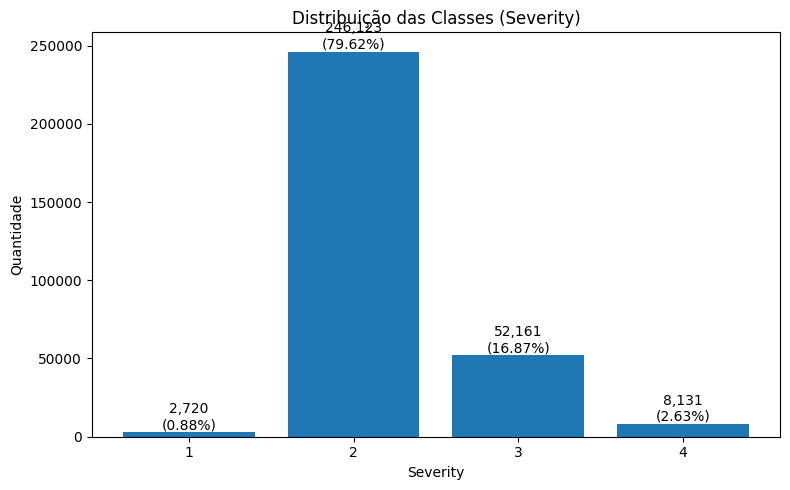

In [ ]:
# total informado
total = X_train_pd.shape[0]

# contagem das classes
counts = y_train_pd.value_counts().sort_index()

# porcentagem em relação ao total
percent = (counts / total) * 100

# criar gráfico
plt.figure(figsize=(8,5))
bars = plt.bar(counts.index.astype(str), counts.values)

# adicionar labels (quantidade + %)
for bar, count, pct in zip(bars, counts.values, percent.values):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        f'{count:,}\n({pct:.2f}%)',
        ha='center',
        va='bottom'
    )

# títulos
plt.title('Distribuição das Classes (Severity)')
plt.xlabel('Severity')
plt.ylabel('Quantidade')

plt.tight_layout()
plt.show()

### Mapas

In [ ]:
# centro do mapa (média das coordenadas)
center = [X_train_pd['Start_Lat'].mean(), X_train_pd['Start_Lng'].mean()]

m = folium.Map(location=center, zoom_start=5)

# adicionar alguns pontos (amostra!)
for _, row in X_train_pd.sample(1000).iterrows():
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=2,
        color='blue',
        fill=True
    ).add_to(m)

m

In [ ]:
def get_color(severity):
    if severity == 1:
        return 'green'
    elif severity == 2:
        return 'yellow'
    elif severity == 3:
        return 'orange'
    else:
        return 'red'

m = folium.Map(location=center, zoom_start=5)

for i, row in X_train_pd.sample(1000).iterrows():
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=3,
        color=get_color(y_train_pd[i]),
        fill=True
    ).add_to(m)

m

## 2. Análise Qualitativa

### Análise de Valores Ausentes

In [ ]:
pd.reset_option('display.max_columns')
print("Valores nulos por coluna(contagem)")
X_train_pd.isnull().sum()

Valores nulos por coluna(contagem)


,0
ID,0
Source,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
End_Lat,136083
End_Lng,136083
Distance(mi),0
Description,1


In [ ]:
print("\nValores nulos por coluna(porcentagem)")
X_train_pd.isnull().sum() / len(X_train_pd) * 100


Valores nulos por coluna(porcentagem)


,0
ID,0.000000
Source,0.000000
Start_Time,0.000000
End_Time,0.000000
Start_Lat,0.000000
Start_Lng,0.000000
End_Lat,44.020574
End_Lng,44.020574
Distance(mi),0.000000
Description,0.000323


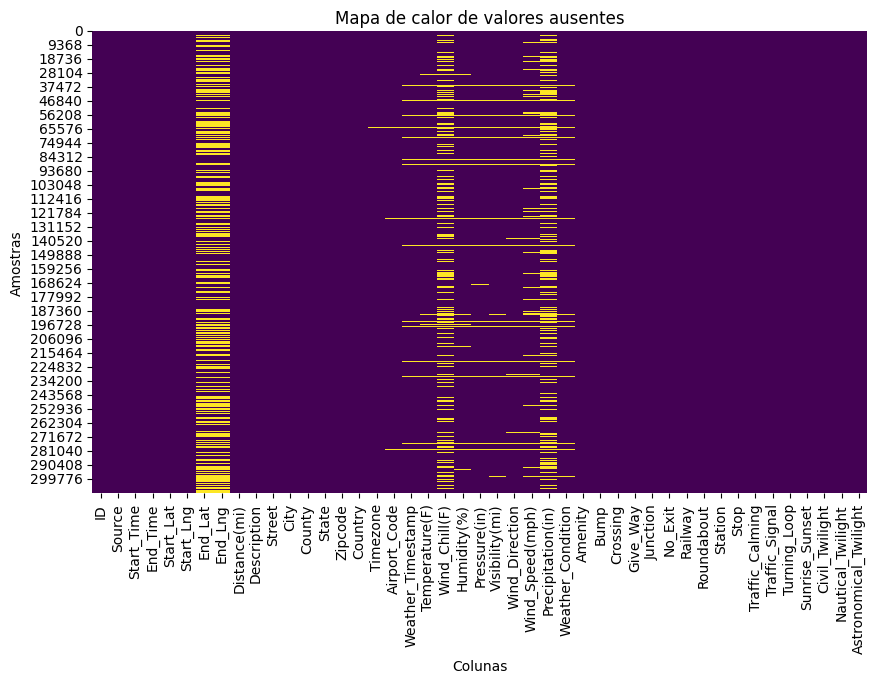

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(X_train_pd.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de calor de valores ausentes')
plt.xlabel('Colunas')
plt.ylabel('Amostras')
plt.show()

In [ ]:
num_cols = [
    'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
    'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Distance(mi)'
]

for col in num_cols:
    X_train_pd[col] = pd.to_numeric(X_train_pd[col], errors='coerce')

for col in num_cols:
    print(f"{col}: skew = {X_train_pd[col].skew():.2f}")

Temperature(F): skew = -0.51
Wind_Chill(F): skew = -0.67
Humidity(%): skew = -0.40
Pressure(in): skew = -3.66
Visibility(mi): skew = 2.75
Wind_Speed(mph): skew = 4.00
Precipitation(in): skew = 105.06
Distance(mi): skew = 11.72


Dado as informações apresentadas é possível traçar estratégias para valores ausentes.

#### Remoção

- End_Lat (44%)
- End_Lng (44%)

Colunas com bastante valores ausentes e podem ter redundância com os valores das coordenadas iniciais pois a diferença entre entre as coordenadas é relativamente pequena. Uma informação interessante seria a distância total do impacto, mas esse dado já é informado por ***Distance(mi)***.

#### Colunas com muitos valores faltantes ou com imputação estratégica

- Preciptation(in) (28.5%)
    - Apesar de ter muitos valores faltantes, a maioria dos valores ter uma tendência a serem nulos e uma dificuldade de imputar valores com precisão. Ainda é muito relevante para acidentes
    - Valores faltantes foram registrados quando não houve precipitação ou teve uma precipitação muito baixa
    - A estratégia nesse caso é imputar valores com 0 e separar uma nova feature binária ***precipitation_event***:
        - 0 - sem precipitação
        - 1 - precipitação
    - ```python
        df['Precipitation_event'] = df['Precipitation(in)'].notnull().astype(int)
        df['Precipitation(in)'] = df['Precipitation(in)'].fillna(0)


- Wind_Chill(F) (25.9%)
    - Esse atributo possui alta correlação com temperatura, a estratégia é imputar com o próprio valor da temperatura
    - ```python
        df['Wind_Chill(F)'] = df['Wind_Chill(F)'].fillna(df['Temperature(F)'])

- Wind_Speed(mph) (7.3%)
    - Nesse caso a imputação por meio da mediano pode ser melhor para evitar problemas com outliers
    - ```python
        df['Wind_Speed(mph)'] = df['Wind_Speed(mph)'].fillna(df['Wind_Speed(mph)'].median())

- Weather_Timestamp (1.58%)
    - É possível imputar apenas com o *Start_time* pois são eventos temporais próximos
    - ```python
        df['Weather_Timestamp'] = df['Weather_Timestamp'].fillna(df['Start_Time'])

#### Imputação direta

- Temperature (2.1%)
- Humidity (2.2%)
- Pressure (1.8%)
- Visibility (2.3%)
    - Estratégia: Mediana
    - ```python
        cols = ['Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)']

        for col in cols:
            df[col] = df[col].fillna(df[col].median())

- Weather_Condition (2.27%)
- Wind_Direction (2.2%)
- Sunrise_Sunset (0.29%)
- Civil_Twilight (0.29%)
- Nautical_Twilight (0.29%)
- Astronomical_Twilight (0.29%)
    - Estratégia: Moda
    - ```python
        cols = ['Weather_Condition', 'Wind_Direction', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight']

        for col in cols:
            df[col] = df[col].fillna(df[col].mode()[0])

#### Colunas categóricas de localização

- Street (0.15%)
- City (0.002%)
- Zipcode (0.02%)
- Airport_Code (0.29%)
- Timezone (0.09%)
    - Remover linhas pode perder dado útil e o modelo lida bem com categoria "Unknown"
    - ```python
        cols = ['Street', 'City', 'Zipcode', 'Airport_Code', 'Timezone']

        for col in cols:
            df[col] = df[col].fillna('Unknown')

### Análise de Valores Duplicados

In [ ]:
X_train_pd.duplicated().sum()

np.int64(0)

In [ ]:
X_train_pd['ID'].duplicated().sum()

np.int64(0)

In [ ]:
subset_cols = ['Start_Time', 'Start_Lat', 'Start_Lng']

X_train_pd.duplicated(subset=subset_cols).sum()

np.int64(894)

In [ ]:
X_train_pd.duplicated(subset=subset_cols).sum() / len(X_train_pd) * 100

np.float64(0.2891940414382066)

In [ ]:
pd.set_option('display.max_columns', None)
dups = X_train_pd[X_train_pd.duplicated(subset=subset_cols, keep=False)]
dups.sort_values(by=subset_cols).head(20)

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
72817,A-3472074,Source1,2016-11-18 18:42:53,2016-11-19 00:42:53,42.28075,-87.97394,42.28075,-87.97394,0.000,At Butterfield Rd - Accident.,W Park Ave,Libertyville,Lake,IL,60048-2555,US,US/Central,KUGN,2016-11-18 18:55:00,45.0,39.7,63.0,29.75,10.0,WSW,10.4,NaN,Overcast,False,False,True,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Night
149759,A-3472073,Source1,2016-11-18 18:42:53,2016-11-19 00:42:53,42.28075,-87.97394,42.28075,-87.97394,0.000,At Butterfield Rd - Accident.,W Park Ave,Libertyville,Lake,IL,60048-2555,US,US/Central,KUGN,2016-11-18 18:55:00,45.0,39.7,63.0,29.75,10.0,WSW,10.4,NaN,Overcast,False,False,True,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Night
51707,A-3614510,Source1,2017-04-13 14:59:00,2017-05-23 01:00:00,40.630613,-75.470595,40.630611,-75.470602,0.000,At Fullerton Ave - Accident. Traffic problem.,US-22 E,Whitehall,Lehigh,PA,18052,US,US/Eastern,KABE,2017-04-13 14:51:00,63.0,NaN,30.0,30.35,10.0,NW,13.8,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day
63162,A-3613041,Source1,2017-04-13 14:59:00,2017-05-23 01:00:00,40.630613,-75.470595,40.630611,-75.470602,0.000,At Fullerton Ave - Accident. Roadwork. Lane bl...,US-22 E,Whitehall,Lehigh,PA,18052,US,US/Eastern,KABE,2017-04-13 14:51:00,63.0,NaN,30.0,30.35,10.0,NW,13.8,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day
136011,A-7688109,Source1,2017-09-28 13:59:25,2017-09-28 19:59:25,35.40482,-80.84126,35.40482,-80.84125999999998,0.000,At Mt Holly-Huntersville Rd - Accident.,Mount Holly Hntrsvlle Rd,Huntersville,Mecklenburg,NC,28078-9729,US,US/Eastern,KJQF,2017-09-28 13:50:00,91.4,NaN,31.0,29.94,10.0,WNW,4.6,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
198594,A-7688110,Source1,2017-09-28 13:59:25,2017-09-28 19:59:25,35.40482,-80.84126,35.40482,-80.84125999999998,0.000,At Gilead Rd/Huntersville-Concord Rd - Accident.,Mount Holly Hntrsvlle Rd,Huntersville,Mecklenburg,NC,28078-9729,US,US/Eastern,KJQF,2017-09-28 13:50:00,91.4,NaN,31.0,29.94,10.0,WNW,4.6,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
142307,A-7673859,Source1,2017-10-20 23:31:52,2017-10-21 06:42:22,39.00106,-76.98239,38.994867,-76.985656,0.462,Closed at Takoma Park - Road closed due to acc...,New Hampshire Ave,Silver Spring,Prince George's,MD,20903,US,US/Eastern,KCGS,2017-10-20 23:25:00,49.6,NaN,95.0,30.25,10.0,Calm,NaN,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
285628,A-7673858,Source1,2017-10-20 23:31:52,2017-10-21 05:31:52,39.00106,-76.98239,38.99921,-76.983331,0.137,Closed at MD-193/University Blvd - Road closed...,New Hampshire Ave,Silver Spring,Prince George's,MD,20903,US,US/Eastern,KCGS,2017-10-20 23:25:00,49.6,NaN,95.0,30.25,10.0,Calm,NaN,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
62333,A-7621011,Source1,2018-02-16 13:45:56,2018-02-16 14:15:56,30.268956,-95.831594,30.268956,-95.831594,0.000,At TX-105 - Accident.,County Road 302,Plantersville,Grimes,TX,77363,US,US/Central,KDWH,2018-02-16 13:53:00,77.0,NaN,69.0,30.08,10.0,SSW,8.1,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
212034,A-7621009,Source1,2018-02-16 13:45:56,2018-02-

- Não foi identificado duplicatas diretamente, mas quando foi filtrado por coordenada e horário foi identificado 894 instâncias.
- Isso representa menos de 0.5% dos dados.
- Depois de fazer uma análise das duplicadas, foi constatado que de fato os dados eram praticamente idênticos e provavelmente foi registrado a mesma instância, ou instâncias muito parecidas, para o mesmo acidente envolvendo mais de um veículo.
- A estratégia é remover os dados duplicados.
- ```python
    subset_cols = ['Start_Time', 'Start_Lat', 'Start_Lng']

    df = df.drop_duplicates(subset=subset_cols, keep='first')

## 3. Análise Univariada

### Numérica

Adicionar a feature de duração total calculando a diferença do tempo final e do tempo inicial: ***Duration = End_Time - Start_Time***

In [ ]:
X_train_pd['Start_Time'] = pd.to_datetime(X_train_pd['Start_Time'], format='ISO8601')
X_train_pd['End_Time'] = pd.to_datetime(X_train_pd['End_Time'], format='ISO8601')
X_train_pd['Duration'] = (X_train_pd['End_Time'] - X_train_pd['Start_Time']).dt.total_seconds() / 60

In [ ]:
X_train_pd

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Duration
0,A-6339582,Source1,2021-01-28 07:59:00,2021-01-28 09:36:59,33.568201,-117.700007,33.567347,-117.69889,0.087,Incident on CA-73 SB near MOULTON PKY Expect d...,CA-73 S,Laguna Niguel,Orange,CA,92677,US,US/Pacific,KSNA,2021-01-28 07:53:00,47.0,47.0,66.0,29.96,10.0,CALM,0.0,0.00,Partly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,97.983333
1,A-2473847,Source2,2018-11-22 06:40:05,2018-11-22 07:09:22,40.639874,-74.290482,None,None,0.000,Right lane blocked and shoulder blocked due to...,Garden State Pkwy S,Cranford,Union,NJ,07016,US,US/Eastern,KLDJ,2018-11-22 06:35:00,19.9,7.9,43.0,30.42,10.0,NNW,11.5,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Day,Day,Day,29.283333
2,A-7653289,Source1,2017-12-27 13:31:20,2017-12-27 19:31:20,39.847949,-85.497373,39.848551,-85.495626,0.102,At IN-3/Exit 123 - Accident. Left lane blocked.,I-70 E,Knightstown,Henry,IN,46148,US,US/Eastern,KMQJ,2017-12-27 13:35:00,NaN,NaN,NaN,NaN,NaN,North,NaN,NaN,None,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,360.000000
3,A-5459836,Source1,2023-01-31 09:00:30,2023-01-31 11:26:00,42.135336,-87.78659,42.096702,-87.764732,2.895,Stationary traffic on Edens Expy S - I-94 E - ...,Edens Expy S,Northbrook,Cook,IL,60062,US,US/Central,KPWK,2023-01-31 08:52:00,5.0,-4.0,58.0,29.74,10.0,W,5.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,145.500000
4,A-6177933,Source1,2021-12-04 18:58:00,2021-12-04 20:20:37,40.890109,-78.227685,40.889726,-78.228273,0.041,Multi vehicle crash on PA 53 both directions a...,Walton St,Philipsburg,Clearfield,PA,16866-2737,US,US/Eastern,KFIG,2021-12-04 18:54:00,38.0,33.0,38.0,28.52,10.0,W,6.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,82.616667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309130,A-2219152,Source2,2019-03-14 09:29:19,2019-03-14 12:00:18,44.889355,-93.349731,None,None,0.000,Accident on MN-100 Southbound at MN-62.,MN-62 E,Minneapolis,Hennepin,MN,55435,US,US/Central,KMSP,2019-03-14 09:53:00,42.1,38.4,100.0,29.24,0.2,ENE,5.8,0.01,Fog,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,150.983333
309131,A-761237,Source2,2021-12-29 08:40:26,2021-12-29 09:09:56,32.724049,-117.164909,None,None,0.000,Accident on Grape St Southbound at I-5.,I-5 S,San Diego,San Diego,CA,92101,US,US/Pacific,KSAN,2021-12-29 08:51:00,51.0,51.0,89.0,29.93,10.0,E,5.0,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,29.500000
309132,A-2815796,Source2,2018-05-10 05:47:34,2018-05-10 06:16:50,35.211979,-90.207092,None,None,0.000,Accident on I-55 Northbound at Exit 10 US-64.,US Highway 64,Marion,Crittenden,AR,72364,US,US/Central,KAWM,2018-05-10 05:53:00,71.1,NaN,68.0,29.97,10.0,SSW,5.8,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,True,False,Night,Day,Day,Day,29.266667
309133,A-5512027,Source1,2021-10-25 15:17:00,2021-10-25 16:33:12,42.367754,-83.139712,42.378354,-83.146078,0.801,Incident on I-96 WB near LIVERNOIS Left lane b...,W Chicago,Detroit,Wayne,MI,48204,US,US/Eastern,KDET,2021-10-25 14:53:00,51.0,51.0,86.0,29.08,10.0,NNE,1

In [ ]:
num_cols = [
    'Temperature(F)', 'Humidity(%)', 'Pressure(in)',
    'Visibility(mi)', 'Wind_Speed(mph)',
    'Precipitation(in)', 'Distance(mi)', 'Duration'
]

X_train_pd[num_cols].describe()

,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Distance(mi),Duration
count,302513.000000,302127.000000,303431.000000,302007.000000,286394.000000,220882.000000,309135.000000,3.091350e+05
mean,61.655538,64.912361,29.540386,9.084364,7.682015,0.008242,0.561491,4.544159e+02
std,18.991634,22.789038,1.004790,2.720259,5.380138,0.107275,1.673992,1.364491e+04
min,-89.000000,1.000000,0.300000,0.000000,0.000000,0.000000,0.000000,4.000000e+00
25%,49.000000,48.000000,29.370000,10.000000,4.600000,0.000000,0.000000,3.141667e+01
50%,64.000000,67.000000,29.860000,10.000000,7.000000,0.000000,0.030000,7.480000e+01
75%,76.000000,84.000000,30.030000,10.000000,10.400000,0.000000,0.466000,1.250667e+02
max,129.200000,100.000000,58.040000,100.000000,518.000000,23.970000,115.379997,2.236280e+06


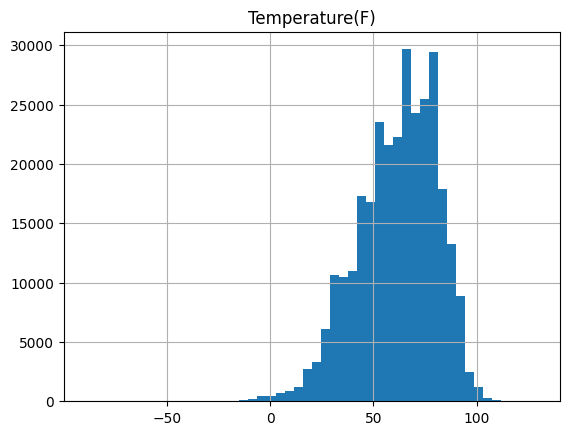

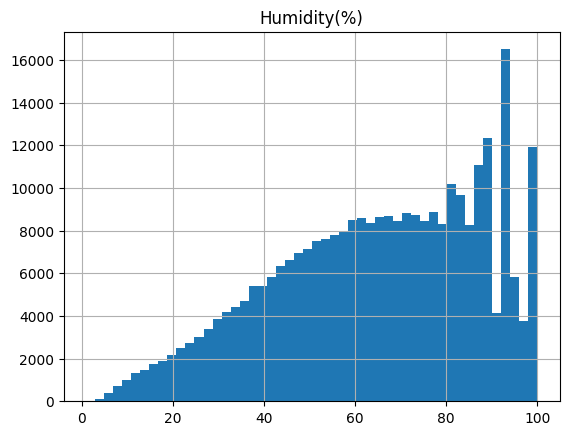

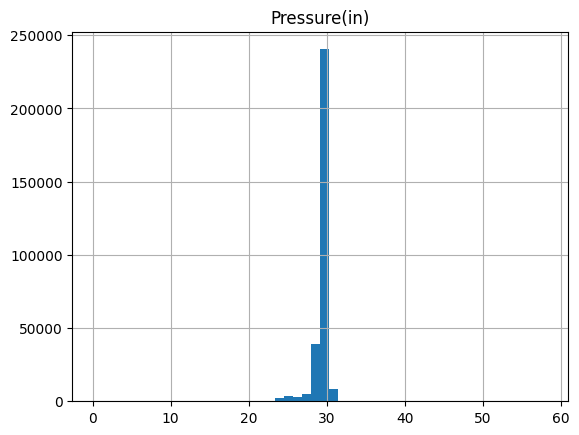

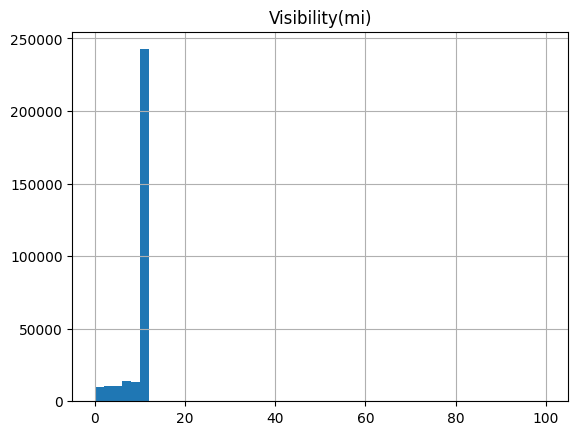

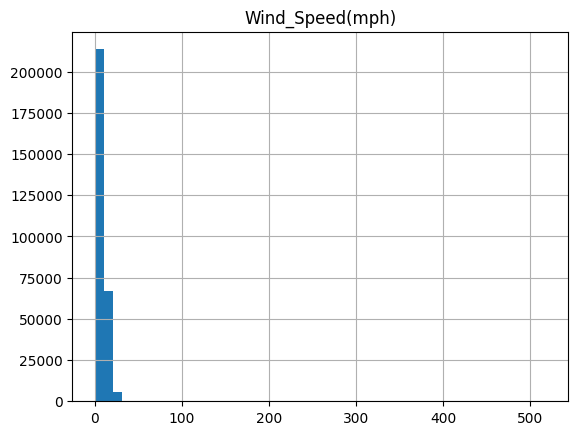

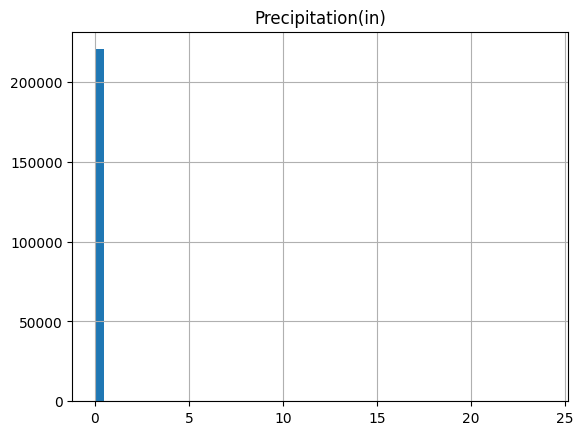

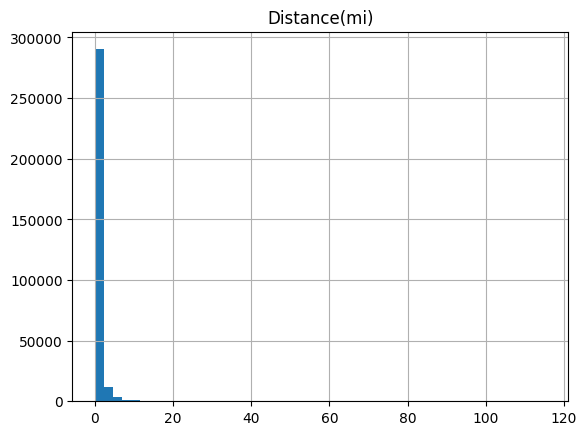

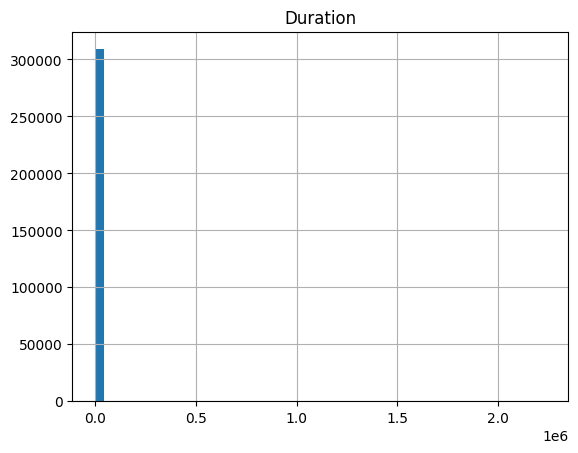

In [ ]:
for col in num_cols:
    X_train_pd[col].hist(bins=50)
    plt.title(col)
    plt.show()

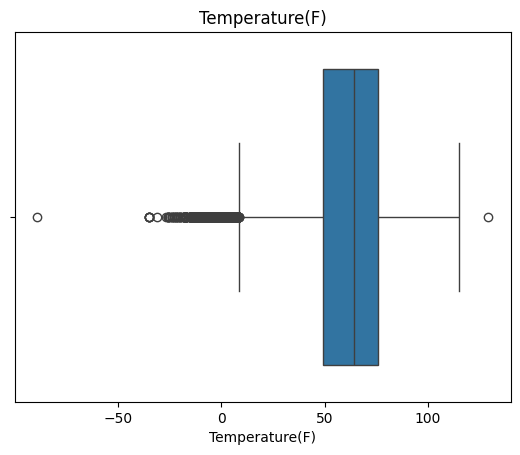

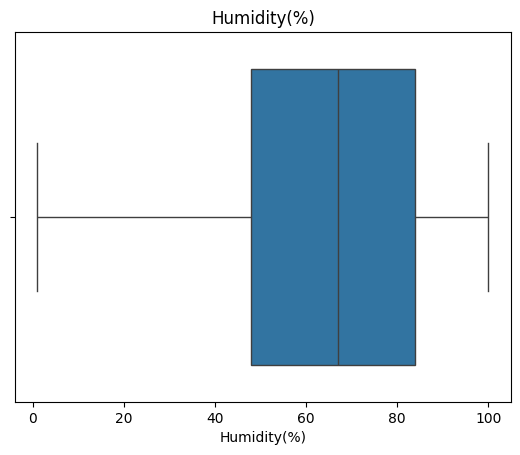

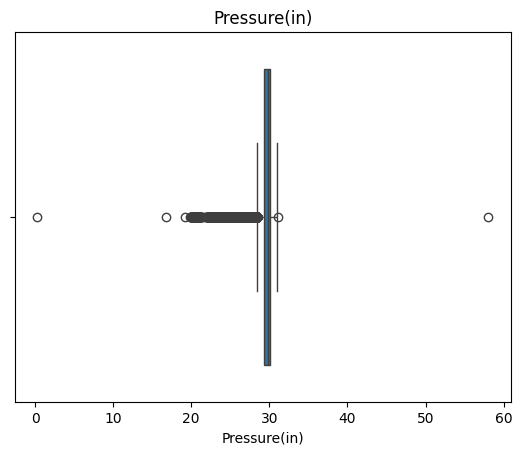

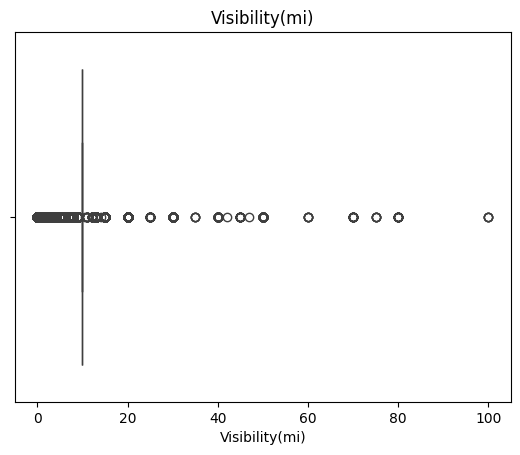

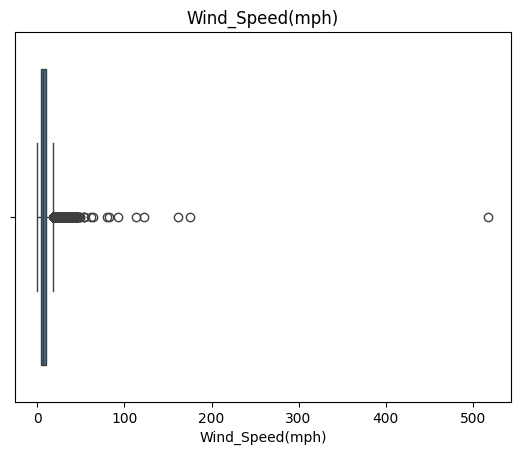

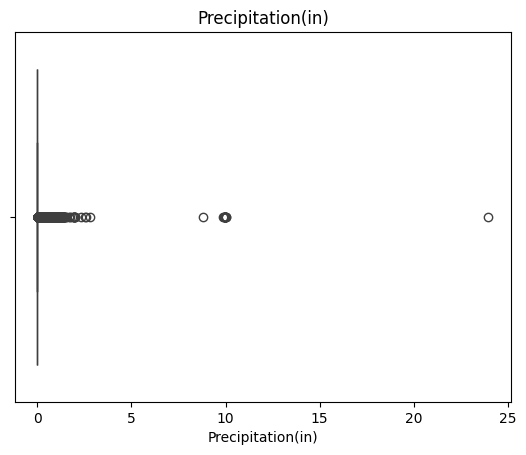

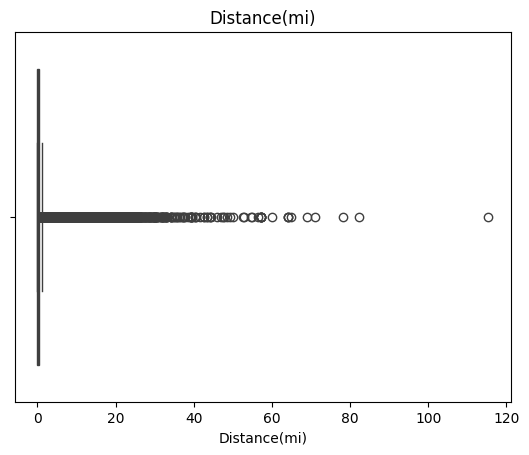

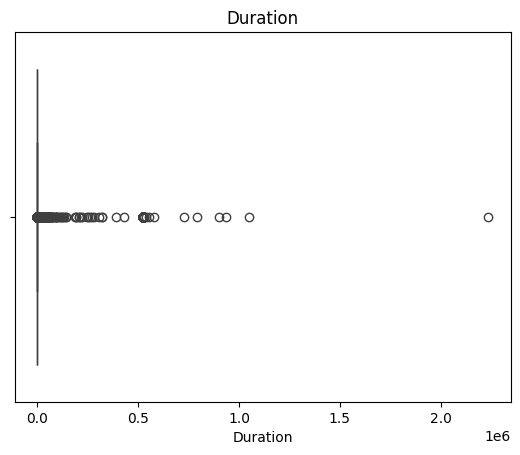

In [ ]:
for col in num_cols:
    sns.boxplot(x=X_train_pd[col])
    plt.title(col)
    plt.show()

Será necessário avaliar os Boxplots para saber se os Outliers são ruídos e se é possível ajustá-los ou não. Já é possível identificar inconsistências nos valores de ***Temperature(F), Precipitation(in), Duration e Wind_Speed(mph)***

#### Análise de Ruído

Nesse etapa o foco é a identificação de potenciais ruídos no conjunto de dados e encontrar técnicas para tratamento de ruídos com o objetivo de ajustá-los ou eliminá-los, deixando assim apenas outliers.

##### Duration

In [ ]:
high_duration = X_train_pd.copy()
high_duration['Severity'] = y_train_pd.values

high_duration = high_duration[(high_duration['Duration'] > 1440*6) & (high_duration['Severity'] == 4)]
high_duration.sort_values(by='Duration', ascending=False)

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Duration,Severity
183335,A-6365106,Source1,2020-02-16 06:00:00,2021-11-01 20:00:31,32.271805,-111.010535,32.279947,-111.017299,0.687,Construction work on N I-10 Frontage Rd Westbo...,W Prince Rd,Tucson,Pima,AZ,85705,US,US/Mountain,KDMA,2020-02-16 05:58:00,41.0,35.0,66.0,27.32,10.00,ESE,10.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Day,899400.516667,4
214568,A-3572395,Source1,2016-01-14 20:18:33,2017-02-19 00:38:00,40.630609,-75.470606,40.630292,-75.47169699999998,0.061,Closed at Fullerton Ave - Road closed due to a...,US-22 E,Whitehall,Lehigh,PA,18052,US,US/Eastern,KABE,2016-01-14 19:51:00,31.0,31.0,69.0,29.53,10.00,N,3.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,577699.450000,4
147180,A-5490797,Source1,2021-04-12 06:20:30,2022-04-12 08:16:00,32.447766,-93.984271,32.44649606544281,-93.97783128746994,0.386,Accident on I-20 Eastbound near US-79 Northbou...,I-20,Greenwood,Caddo,LA,71033,US,US/Central,KSHV,2021-04-12 05:53:00,53.0,53.0,83.0,29.61,10.00,CALM,0.0,0.00,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day,525715.500000,4
41819,A-6025127,Source1,2021-11-25 14:47:00,2022-11-25 16:32:00,30.236077,-93.196834,30.236362,-93.191617,0.312,Construction on I-10 EB near OPELOUSAS ST Road...,US-90 E,Lake Charles,Calcasieu,LA,70601,US,US/Central,KCWF,2021-11-25 14:45:00,66.0,66.0,94.0,30.11,10.00,CALM,0.0,0.00,Light Rain,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,525705.000000,4
105560,A-4421344,Source1,2022-02-04 16:19:00,2023-02-04 18:04:00,30.473863,-90.863234,30.473717,-90.863236,0.010,Construction on LA-447 SB near VERA MCGOWAN RD...,Pendarvis Ln,Walker,Livingston,LA,70785-7739,US,US/Central,KBTR,2022-02-04 15:53:00,38.0,31.0,73.0,30.31,10.00,NNW,9.0,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day,525705.000000,4
55520,A-5225443,Source1,2022-01-02 07:49:00,2023-01-02 09:34:00,32.519692,-93.809177,32.48867218238583,-93.82609668297856,2.359,Construction on I-220 WB near CROSS LAKE Road ...,I-220,Shreveport,Caddo,LA,71107,US,US/Central,KDTN,2022-01-02 07:53:00,28.0,17.0,NaN,29.97,10.00,NW,15.0,0.00,N/A Precipitation,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,525705.000000,4
6531,A-5821177,Source1,2021-11-06 03:54:00,2022-11-06 05:39:00,30.448412,-91.249307,30.447217,-91.24434,0.307,Construction on I-10 EB near LA-77 Road closed...,I-10 E,Port Allen,West Baton Rouge,LA,70767,US,US/Central,KBTR,2021-11-06 03:53:00,51.0,51.0,92.0,30.14,10.00,NNE,5.0,0.00,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,525705.000000,4
55098,A-4677429,Source1,2022-02-06 22:22:00,2023-02-07 00:07:00,30.439666,-91.01885,30.438344,-91.02413,0.328,Incident on I-12 Westbound near Amite River (6...,I-12 W,Baton Rouge,East Baton Rouge,LA,70816,US,US/Central,KBTR,2022-02-06 21:53:00,41.0,41.0,67.0,30.16,10.00,CALM,0.0,0.00,Fair,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Night,525705.000000,4
119508,A-5533453,Source1,2021-03-21 22:07:00,2022-03-21 23:52:00,30.009166,-90.235187,30.009496002130465,-90.24464681483157,0.566,Construction on I-10 WB near DUNCAN CANAL Road...,I-10,Kenner,Jefferson,LA,70065,US,US/Central,KM

- Verificou-se que valores altos de ***Duration*** com severidade 2 se tratavam de ruídos, e não outliers. E valores altos de ***Duration*** com severidade 4, eram de fato outliers.

- Isso provavelmente aconteceu porque para acidentes **leves** (severidade 2) foram anotados em dias diferentes, mas com horários próximos. Em algumas instâncias, mesmo com severidade 2, foi anotado uma duração alta devido condições climáticas. Mas como foram poucas ocorrências e que não afetaria o treinamento do modelo, esses casos foram tratados como ruídos e eliminados.

- Enquanto que, para acidentes anotados como **graves** (severidade 4) houveram algumas instâncias que duraram meses ou até anos e isso foi verificado como **outlier** porque a descrição do acidente foi anotada como uma **interdição da pista** por conta de **reformas, construções, pista colapsada e etc**. Ou seja, realmente foram casos muito extremos.

- A estratégia adotada é criar uma função para ajustar as datas em ***End_Time*** para casos de severidade 2 que passaram de um dia se a duração for de alguns minutos, caso contrário descarta a linha.

- ``` python
    def tratar_ruidos_temporais(X, y,
                        min_dur=1440,  # 1 dia
                        low_sev=2,
                        tolerancia_horas=4):

        df = X.copy()
        df['Severity'] = y.values
        
        # garantir datetime
        df['Start_Time'] = pd.to_datetime(df['Start_Time'])
        df['End_Time'] = pd.to_datetime(df['End_Time'])
        
        # duração em minutos
        df['Duration_min'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds() / 60
        
        # filtro: duração entre 1 e 4 dias + baixa severidade
        mask = (
            (df['Duration_min'] >= min_dur) &
            (df['Severity'] <= low_sev)
        )
        
        subset = df[mask].copy()
        
        # extrair horas (em minutos do dia)
        start_minutes = subset['Start_Time'].dt.hour * 60 + subset['Start_Time'].dt.minute
        end_minutes = subset['End_Time'].dt.hour * 60 + subset['End_Time'].dt.minute
        
        # diferença considerando virada de dia
        diff_minutes = np.abs(end_minutes - start_minutes)
        diff_minutes = np.minimum(diff_minutes, 1440 - diff_minutes)
        
        subset['hour_diff'] = diff_minutes
        
        # CASO 1: discrepância pequena → corrigir
        corrigir_mask = subset['hour_diff'] <= tolerancia_horas * 60
        
        # corrigir End_Time (trazer para o mesmo dia)
        idx_corrigir = subset[corrigir_mask].index
        
        df.loc[idx_corrigir, 'End_Time'] = df.loc[idx_corrigir, 'Start_Time'] + \
            pd.to_timedelta(subset.loc[idx_corrigir, 'hour_diff'], unit='m')
        
        # CASO 2: discrepância grande → remover
        remover_mask = subset['hour_diff'] > tolerancia_horas * 60
        idx_remover = subset[remover_mask].index
        
        df = df.drop(index=idx_remover)
        
        # recalcular duração
        df['Duration_min'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds() / 60
        
        # separar novamente X e y
        y_new = df['Severity']
        X_new = df.drop(columns=['Severity'])
        
        return X_new, y_new
    
- ```python
    X_train_pd, y_train_pd = tratar_ruidos_temporais(X_train_pd, y_train_pd)

##### Precipitation

In [ ]:
high_precipitation = X_train_pd.copy()
high_precipitation['Severity'] = y_train_pd.values

high_precipitation = high_precipitation[(high_precipitation['Precipitation(in)'] > 1.5) & (high_precipitation['Severity'] <= 3)]
high_precipitation.sort_values(by='Precipitation(in)', ascending=False)

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Duration,Severity
281463,A-769716,Source2,2021-12-21 21:55:25,2021-12-21 22:24:50,38.663532,-77.275169,None,None,0.000,Right lane closed due to accident on I-95 Nort...,I-95 N,Woodbridge,Prince William,VA,22191,US,US/Eastern,KDAA,2021-12-21 21:56:00,37.0,37.0,94.0,29.78,10.00,CALM,0.0,23.97,Light Drizzle,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,29.416667,3
265521,A-3042575,Source2,2018-01-03 13:31:38,2018-01-03 14:16:25,40.718971,-73.974968,None,None,0.000,Left lane blocked due to accident on FDR Dr So...,E Houston St,New York,New York,NY,10002-1118,US,US/Eastern,KJRB,2018-01-03 13:35:00,28.4,23.3,43.0,NaN,10.00,Variable,4.6,10.02,Clear,False,False,True,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day,44.783333,2
273888,A-3629990,Source1,2017-06-15 17:40:21,2017-06-15 23:40:21,40.70833,-74.00014,40.70891,-74.00075,0.051,Ramp to Brooklyn Brg Southbound - Accident.,Brooklyn Bridge,New York,New York,NY,10038,US,US/Eastern,KJRB,2017-06-15 17:35:00,71.6,NaN,53.0,30.42,10.00,ESE,6.9,10.00,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,360.000000,2
16163,A-3165267,Source2,2017-11-03 19:33:39,2017-11-03 20:18:33,40.625526,-73.932426,None,None,0.000,Accident on Avenue K at 45th St.,E 45th St,Brooklyn,Kings,NY,11234-3003,US,US/Eastern,KJRB,2017-11-03 19:35:00,64.4,NaN,68.0,NaN,10.00,Variable,4.6,9.99,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,44.900000,2
126313,A-328077,Source2,2017-02-09 11:10:30,2017-02-09 11:40:17,40.625038,-73.995331,None,None,0.000,Accident Truck involved on 15th Ave at 62nd St.,15th Ave,Brooklyn,Kings,NY,11219-5401,US,US/Eastern,KJRB,2017-02-09 11:15:00,30.2,21.9,93.0,30.40,0.50,East,9.2,9.99,Light Freezing Fog,True,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day,29.783333,2
16473,A-419838,Source2,2017-04-03 16:54:24,2017-04-03 17:39:09,40.70174,-73.991264,None,None,0.010,Right lane blocked due to accident on I-278 Qu...,Brooklyn Queens Expy,Brooklyn,Kings,NY,11201,US,US/Eastern,KJRB,2017-04-03 16:55:00,55.4,NaN,54.0,30.42,10.00,Variable,5.8,9.99,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,44.750000,3
21720,A-2663460,Source2,2018-08-23 21:16:47,2018-08-23 22:01:30,40.691647,-73.999306,None,None,0.000,Right lane blocked due to accident on I-278 Br...,Brooklyn Queens Expy,Brooklyn,Kings,NY,11201,US,US/Eastern,KJRB,2018-08-23 21:15:00,75.2,NaN,53.0,30.42,10.00,North,NaN,9.99,Clear,False,False,True,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Day,44.716667,3
141430,A-3599051,Source1,2017-04-12 12:42:25,2017-04-12 18:42:25,40.71111,-73.95532,40.71391,-73.95316,0.224,At Williamsburg Bridge/Exit 32 - Accident.,Brooklyn Queens Expy,Brooklyn,Kings,NY,11211,US,US/Eastern,KJRB,2017-04-12 12:55:00,62.6,NaN,77.0,30.43,6.00,Variable,3.5,9.99,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,360.000000,2
13865,A-3042604,Source2,2018-01-03 18:23:21,2018-01-03 18:52:17,40.714836,-73.97654,None,None,0.000,Right lane blocked due to accident on FDR Dr S...,Williamsburg Brg E,New York,New York,NY,10009,US,US/Eastern,KJRB,2018-01-03 15:35:00,32.0,28.7,35.0,NaN,10.00,WSW,3.5,9.96,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Night

In [ ]:
high_precipitation[['Precipitation(in)', 'Weather_Condition', 'Severity', 'Description']].sort_values(by='Precipitation(in)', ascending=False)

,Precipitation(in),Weather_Condition,Severity,Description
281463,23.97,Light Drizzle,3,Right lane closed due to accident on I-95 Nort...
265521,10.02,Clear,2,Left lane blocked due to accident on FDR Dr So...
273888,10.00,Clear,2,Ramp to Brooklyn Brg Southbound - Accident.
16163,9.99,Clear,2,Accident on Avenue K at 45th St.
126313,9.99,Light Freezing Fog,2,Accident Truck involved on 15th Ave at 62nd St.
16473,9.99,Clear,3,Right lane blocked due to accident on I-278 Qu...
21720,9.99,Clear,3,Right lane blocked due to accident on I-278 Br...
141430,9.99,Overcast,2,At Williamsburg Bridge/Exit 32 - Accident.
13865,9.96,Clear,2,Right lane blocked due to accident on FDR Dr S...
139303,9.96,None,2,Accident on Shore Pkwy Westbound at Bay 14th St.


- A primeira estratégia foi analisar até que valor de precipitação, comparada com o campo de ***Weather_Condition*** e ***Severity***, é viável e faz sentido.

- Em seguida, foi verificado que teve valores muito absurdos provavelmente provocados por algum erro de sensor ou de anotação de valores errados. Então, a estratégia adotada pra lidar com isso é eliminar essas instâncias (muito poucas).

- ```python
    mask = (
        (X_train_pd['Precipitation(in)'] > 1.5) &
        (y_train_pd <= 3)
    )

    idx_remove = X_train_pd[mask].index

    X_train_pd = X_train_pd.drop(index=idx_remove)
    y_train_pd = y_train_pd.drop(index=idx_remove)

##### Wind_Speed

In [ ]:
X_train_pd['Weather_Condition'].unique()

array(['Partly Cloudy', 'Clear', None, 'Fair', 'Light Rain', 'Cloudy',
       'Overcast', 'Fog', 'Scattered Clouds', 'Mostly Cloudy',
       'Light Snow', 'Cloudy / Windy', 'Thunder in the Vicinity',
       'Light Drizzle', 'Thunder', 'Rain', 'Smoke', 'Fair / Windy',
       'Haze', 'Light Snow / Windy', 'Heavy Rain',
       'Mostly Cloudy / Windy', 'Wintry Mix', 'Snow / Windy', 'Snow',
       'N/A Precipitation', 'Light Rain with Thunder', 'T-Storm',
       'Partly Cloudy / Windy', 'Mist', 'Thunderstorms and Rain',
       'Thunderstorm', 'Shallow Fog', 'Snow and Thunder',
       'Light Freezing Rain', 'Heavy Thunderstorms and Rain',
       'Thunder / Windy', 'Heavy T-Storm', 'Light Rain / Windy',
       'Heavy Rain / Windy', 'Drizzle', 'Light Thunderstorms and Rain',
       'Patches of Fog', 'Hail', 'Heavy Snow / Windy',
       'Light Freezing Drizzle', 'Sleet', 'Haze / Windy',
       'Showers in the Vicinity', 'Freezing Rain / Windy', 'Rain / Windy',
       'Light Thunderstorms and Sn

In [ ]:
high_wind_speed = X_train_pd.copy()
high_wind_speed['Severity'] = y_train_pd.values

high_wind_speed = high_wind_speed[(high_wind_speed['Wind_Speed(mph)'] > 40) & (high_wind_speed['Severity'] >= 2)]
high_wind_speed.sort_values(by='Wind_Speed(mph)', ascending=False)

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Duration,Severity
14167,A-7234025,Source1,2020-01-22 05:05:00,2020-01-22 06:17:51,33.808924,-118.287496,33.808924,-118.287496,0.000,At I-110/Harbor Fwy - Accident.,Sepulveda Blvd,Carson,Los Angeles,CA,90745,US,US/Pacific,KTOA,2020-01-22 06:50:00,NaN,NaN,NaN,30.08,4.00,SW,518.0,NaN,Cloudy / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,72.850000,2
140115,A-3648096,Source1,2017-07-10 17:11:32,2017-07-10 23:11:32,37.45227,-122.12716,37.44746,-122.1217,0.447,At Embarcadero Rd/Exit 402 - Accident.,Bayshore Fwy S,Palo Alto,Santa Clara,CA,94303,US,US/Pacific,KPAO,2017-07-10 16:47:00,69.8,NaN,78.0,29.88,10.00,NNW,174.9,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,360.000000,2
107693,A-7770041,Source1,2019-08-07 17:09:41,2019-08-07 17:38:20,27.05077,-80.2354,26.92571,-80.14796,10.181,Between CR-708/Exit 96 and SR-706/Exit 87 - Ac...,I-95 S,Hobe Sound,Martin,FL,33455,US,US/Eastern,KSUA,2019-08-07 16:47:00,82.0,82.0,74.0,30.01,5.00,E,161.0,0.00,T-Storm / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,28.650000,2
58385,A-5239401,Source1,2022-01-03 10:15:40,2022-01-03 12:00:40,44.287762,-121.540259,44.287508,-121.539535,0.040,An unconfirmed report of a crash has been rece...,Highway 20,Sisters,Deschutes,OR,97759,US,US/Pacific,KRDM,2022-01-03 10:56:00,37.0,17.0,87.0,26.39,10.00,S,122.0,0.00,Light Rain / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,105.000000,2
248969,A-2147439,Source2,2019-04-04 16:33:10,2019-04-04 17:33:01,35.274849,-80.767059,None,None,0.000,Accident on Owen Blvd at US-29 Tryon St.,N Tryon St,Charlotte,Mecklenburg,NC,28213-7915,US,US/Eastern,KJQF,2019-04-04 16:50:00,73.0,73.0,25.0,29.54,10.00,SSE,113.0,0.00,Fair / Windy,False,False,True,False,False,False,True,False,False,False,False,True,False,Day,Day,Day,Day,59.850000,2
46449,A-5148249,Source1,2022-08-04 14:55:30,2022-08-04 19:29:16,32.788653,-96.585002,32.776041,-96.511501,4.358,Stationary traffic on US-80 E from Belt Line R...,US-80,Mesquite,Dallas,TX,75149,US,US/Central,KHQZ,2022-08-04 14:50:00,99.0,99.0,29.0,29.45,7.00,SSE,93.0,0.00,Fair / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,273.766667,2
194735,A-4901417,Source1,2022-08-18 15:57:00,2022-08-18 17:05:00,38.651073,-121.370681,38.674638,-121.34508999999998,2.135,Slow traffic on I-80 E from I-80 Bus (I-80) to...,I-80 E,Sacramento,Sacramento,CA,95841,US,US/Pacific,KMCC,2022-08-18 15:50:00,102.0,102.0,17.0,29.69,10.00,SW,82.0,0.00,Fair / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,68.000000,2
292415,A-3250538,Source2,2017-10-17 16:06:20,2017-10-17 16:51:06,32.684486,-97.093452,None,None,0.000,Accident on Arbrook Blvd in Arlington.,E Arbrook Blvd,Arlington,Tarrant,TX,76014-3339,US,US/Central,KGPM,2017-10-17 15:50:00,73.4,NaN,27.0,30.18,10.00,East,79.4,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,44.766667,2
110136,A-2703574,Source2,2018-07-13 19:20:53,2018-07-13 19:50:42,31.763216,-106.35553,None,None,0.000,Accident on FM-2316 McRae Blvd at Sims Dr.,McRae Blvd,El Paso,El Paso,TX,79925,US,US/Mountain,KELP,2018-07-13 19:20:00,72.0,NaN,73.0,30.11,1.00,WSW,61.0,0.01,Heavy Thunderstorms and Rain,False,False,False,False,False,False,False,

In [ ]:
high_wind_speed[['Wind_Speed(mph)', 'Weather_Condition', 'Severity', 'Description']].sort_values(by='Wind_Speed(mph)', ascending=False)

,Wind_Speed(mph),Weather_Condition,Severity,Description
14167,518.0,Cloudy / Windy,2,At I-110/Harbor Fwy - Accident.
140115,174.9,Clear,2,At Embarcadero Rd/Exit 402 - Accident.
107693,161.0,T-Storm / Windy,2,Between CR-708/Exit 96 and SR-706/Exit 87 - Ac...
58385,122.0,Light Rain / Windy,2,An unconfirmed report of a crash has been rece...
248969,113.0,Fair / Windy,2,Accident on Owen Blvd at US-29 Tryon St.
46449,93.0,Fair / Windy,2,Stationary traffic on US-80 E from Belt Line R...
194735,82.0,Fair / Windy,2,Slow traffic on I-80 E from I-80 Bus (I-80) to...
292415,79.4,Clear,2,Accident on Arbrook Blvd in Arlington.
110136,61.0,Heavy Thunderstorms and Rain,2,Accident on FM-2316 McRae Blvd at Sims Dr.
223947,54.0,Partly Cloudy / Windy,2,Accident on I-5 Northbound at East Escape Ramp.


- A partir de um subconjunto de dados de velocidade do vento, foi verificado alguns outiliers.

- Após investigação foi identificado alguns poucos ruídos a partir da discrepância de valores reais de velocidade do vento e da comparação entre a velocidade do vento e das condições climáticas.

- A estratégia adotada será remover os ruídos identificados.

- ```python
     good_contition = [
        'Clear', 'Fair', 'Partly Cloudy',
        'Mostly Cloudy', 'Scattered Clouds'
     ]

     mask = (
        (X_train_pd['Wind_Speed(mph)'] > 60) &
        (X_train_pd['Weather_Condition'].isin(good_condition)
     )

     idx_remove = X_train_pd[mask].index

     X_train_pd = X_train_pd.drop(index=idx_remove)
     y_train_pd = y_train_pd.drop(index=idx_remove)

##### Temperature

In [ ]:
Q1 = X_train_pd['Temperature(F)'].quantile(0.25)
Q3 = X_train_pd['Temperature(F)'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

In [ ]:
temperature_outlier = X_train_pd.copy()
temperature_outlier['Severity'] = y_train_pd.values

temperature_outlier = temperature_outlier[(temperature_outlier['Temperature(F)'] < limite_inferior) | (temperature_outlier['Temperature(F)'] > limite_superior)]
temperature_outlier.sort_values(by='Temperature(F)', ascending=False)

,ID,Source,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Duration,Severity
125549,A-2462818,Source2,2018-11-16 16:13:55,2018-11-16 16:43:55,32.97102,-96.718857,None,None,0.000,Accident on US-75 Northbound at Spring Valley Rd.,US-75 S,Richardson,Dallas,TX,75080,US,US/Central,KADS,2018-11-16 15:47:00,129.2,NaN,4.0,30.06,10.0,SSW,11.5,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,30.000000,2
196299,A-2294218,Source2,2019-02-19 07:35:50,2019-02-19 08:05:36,41.2631,-96.138771,None,None,0.000,Right hand shoulder blocked due to accident on...,N 144th St,Boys Town,Douglas,NE,68010,US,US/Central,KMLE,2019-02-19 07:35:00,8.4,1.8,86.0,30.53,10.0,SE,3.5,NaN,Mostly Cloudy,False,False,True,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day,29.766667,2
115731,A-2270679,Source2,2019-02-07 18:32:23,2019-02-07 19:32:06,41.28754,-96.13887,None,None,0.000,Accident on 144th St Southbound at Eagle Run Dr.,N 144th St,Omaha,Douglas,NE,68164,US,US/Central,KMLE,2019-02-07 18:35:00,8.4,-10.8,60.0,30.31,10.0,WNW,19.6,NaN,Scattered Clouds,False,False,True,False,False,False,False,False,False,False,False,True,False,Night,Night,Day,Day,59.716667,2
216377,A-3153760,Source2,2017-12-28 12:35:07,2017-12-28 13:04:49,44.912338,-93.064331,None,None,0.000,Accident on US-52 Southbound at Butler Ave.,US-52 S,South Saint Paul,Dakota,MN,55075,US,US/Central,KSGS,2017-12-28 12:35:00,8.4,-2.8,73.0,30.38,5.0,SSW,6.9,NaN,Haze,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,29.700000,2
84464,A-2309943,Source2,2019-02-27 04:11:32,2019-02-27 04:41:17,44.790089,-92.862862,None,None,0.660,Accident on MN-95 Manning Ave both ways betwee...,Manning Ave S,Hastings,Washington,MN,55033-9732,US,US/Central,KSGS,2019-02-27 04:15:00,8.2,1.6,83.0,30.32,4.0,NW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,29.750000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43456,A-3839284,Source1,2022-08-18 08:03:55,2022-08-18 08:14:13,27.995963,-82.348136,27.998607,-82.33953299999997,0.556,Slow traffic on I-4 E from US-92/Exit 6 (West)...,I-4 E,Tampa,Hillsborough,FL,33610,US,US/Eastern,KVDF,2022-08-18 07:55:00,-35.0,-35.0,NaN,29.94,7.0,CALM,0.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,10.300000,2
78260,A-522921,Source2,2022-08-30 07:38:55,2022-08-30 08:38:03,27.982759,-82.277672,None,None,0.000,Lane blocked due to crash on FL-574 Dr Martin ...,E Dr Martin Luther King Jr Blvd,Seffner,Hillsborough,FL,33584,US,US/Eastern,KVDF,2022-08-30 07:35:00,-35.0,-35.0,NaN,29.97,10.0,CALM,0.0,0.0,Partly Cloudy,False,False,True,False,False,False,True,False,False,False,False,True,False,Day,Day,Day,Day,59.133333,2
21742,A-3848509,Source1,2022-09-07 06:17:00,2022-09-07 09:49:02,27.970701,-82.453584,27.956107,-82.475922,1.696,Slow traffic on I-275 S from Floribraska Ave/2...,I-275 S,Tampa,Hillsborough,FL,33602,US,US/Eastern,KTPF,2022-09-07 06:15:00,-35.0,-35.0,NaN,29.95,5.0,CALM,0.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Day,212.033333,2
73648,A-522928,Source2,2022-08-30 08:01:14,2022-08-30 08:30:11,27.995848,-82.357773,None,None,0.000,Crash on I-4 Westbound at Exit 7 US-301.,I-4 E,Tampa,Hillsborough,FL,33610,US,US/Ea

In [ ]:
temperature_outlier[['Temperature(F)', 'Weather_Condition', 'Severity', 'City', 'State', 'Description']].sort_values(by='Temperature(F)', ascending=False)

,Temperature(F),Weather_Condition,Severity,City,State,Description
125549,129.2,Clear,2,Richardson,TX,Accident on US-75 Northbound at Spring Valley Rd.
196299,8.4,Mostly Cloudy,2,Boys Town,NE,Right hand shoulder blocked due to accident on...
115731,8.4,Scattered Clouds,2,Omaha,NE,Accident on 144th St Southbound at Eagle Run Dr.
216377,8.4,Haze,2,South Saint Paul,MN,Accident on US-52 Southbound at Butler Ave.
84464,8.2,Overcast,2,Hastings,MN,Accident on MN-95 Manning Ave both ways betwee...
...,...,...,...,...,...,...
43456,-35.0,Fair,2,Tampa,FL,Slow traffic on I-4 E from US-92/Exit 6 (West)...
78260,-35.0,Partly Cloudy,2,Seffner,FL,Lane blocked due to crash on FL-574 Dr Martin ...
21742,-35.0,Fair,2,Tampa,FL,Slow traffic on I-275 S from Floribraska Ave/2...
73648,-35.0,Partly Cloudy,2,Tampa,FL,Crash on I-4 Westbound at Exit 7 US-301.


- Foi identificado alguns ruídos comparando valores de temperatura com a cidade e estado. Fazendo uma análise rápida dos valores históricos já registrados, foi possível identificar que os valores de temperaturas de do conjunto de dados eram ruidosos. Um exemplo disso é que foi registrado -35 graus Farenheit (aproximadamente -37 graus Celcius) em Tampa, Flórida. Esse valor é fisicamente impossível para o local.

- A estratégia adotada é primeiro identificar os outliers usando os limites inferiores e superiores a partir do intervalo interquartil. Depois, identificar os valores máximos e mínimos de temperatura de cada estado e em seguida marcar os ruídos e eliminá-los.

- ```python

    def calcular_limites_por_estado(df):
        limites = {}

        for estado in df['State'].unique():
            subset = df[df['State'] == estado]['Temperature(F)'].dropna()
            
            Q1 = subset.quantile(0.25)
            Q3 = subset.quantile(0.75)
            IQR = Q3 - Q1
            
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR
            
            limites[estado] = (lower, upper)
        
        return limites

    def marcar_ruido_temperatura(df, limites):
        def is_ruido(row):
            estado = row['State']
            temp = row['Temperature(F)']
            
            if pd.isna(temp):
                return False
            
            lower, upper = limites[estado]
            
            return (temp < lower) or (temp > upper)
        
        return df.apply(is_ruido, axis=1)

- ```python
    limites = calcular_limites_por_estado(X_train_pd)

    mask_ruido = marcar_ruido_temperatura(X_train_pd, limites)

    idx_remove = X_train_pd[mask_ruido].index

    X_train_pd = X_train_pd.drop(index=idx_remove)
    y_train_pd = y_train_pd.drop(index=idx_remove)

### Categórica

In [ ]:
def resumo_categoricas(df):
    cat_cols = df.select_dtypes(include=['object', 'bool']).columns

    resumo = []

    for col in cat_cols:
        counts = df[col].value_counts()
        percent = df[col].value_counts(normalize=True) * 100

        resumo.append({
            'feature': col,
            'unique_values': df[col].nunique(),
            'most_frequent': counts.index[0],
            'freq_count': counts.iloc[0],
            'freq_percent (%)': round(percent.iloc[0], 2),
            'missing (%)': round(df[col].isnull().mean() * 100, 2)
        })

    return pd.DataFrame(resumo).sort_values(by='unique_values', ascending=False)

# usar
resumo_df = resumo_categoricas(X_train_pd)
resumo_df

,feature,unique_values,most_frequent,freq_count,freq_percent (%),missing (%)
0,ID,309135,A-3570942,1,0.00,0.00
6,Description,264664,A crash has occurred causing no to minimum del...,384,0.12,0.00
3,Start_Lng,248094,-84.390343,25,0.01,0.00
2,Start_Lat,247695,34.039394,27,0.01,0.00
15,Weather_Timestamp,185085,2022-03-13 01:53:00,56,0.02,1.58
5,End_Lng,145742,-81.471375,41,0.02,44.02
4,End_Lat,145196,28.450015000000004,41,0.02,44.02
11,Zipcode,87995,91761,467,0.15,0.02
7,Street,66395,I-95 N,3202,1.04,0.15
8,City,8608,Miami,7386,2.39,0.00


In [ ]:
cat_cols = [
    'Weather_Condition', 'Wind_Direction', 'Street',
    'City', 'County', 'State', 'Zipcode', 'Country',
    'Timezone', 'Airport_Code', 'Sunrise_Sunset',
    'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight'
]

for col in cat_cols:
    print(f"\n{X_train_pd[col].value_counts()}")


Wind_Direction
CALM        38556
S           16802
W           15361
SSW         15276
WNW         15076
SW          14711
Calm        14637
NW          14573
WSW         14087
SSE         13871
NNW         13234
N           12284
SE          11938
E           11197
ESE         10801
ENE         10429
NE          10391
NNE         10201
VAR         10137
South        7227
West         6468
North        6091
Variable     4567
East         4203
Name: count, dtype: int64

Street
I-95 N          3202
I-95 S          3023
I-5 N           2874
I-10 E          2218
I-10 W          2212
                ... 
 W 120th Ave       1
Braxted Dr         1
Keowee Rd          1
 SW 264th St       1
 Windwood Ln       1
Name: count, Length: 66395, dtype: int64

City
Miami           7386
Houston         6790
Los Angeles     6223
Charlotte       5403
Dallas          5049
                ... 
New Lisbon         1
Bushkill           1
Robesonia          1
Hobbs              1
North Hudson       1
Name: cou

In [ ]:
for col in cat_cols:
    print(col, X_train_pd[col].nunique())

Weather_Condition 97
Wind_Direction 24
Street 66395
City 8608
County 1508
State 49
Zipcode 87995
Country 1
Timezone 4
Airport_Code 1817
Sunrise_Sunset 2
Civil_Twilight 2
Nautical_Twilight 2
Astronomical_Twilight 2


/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


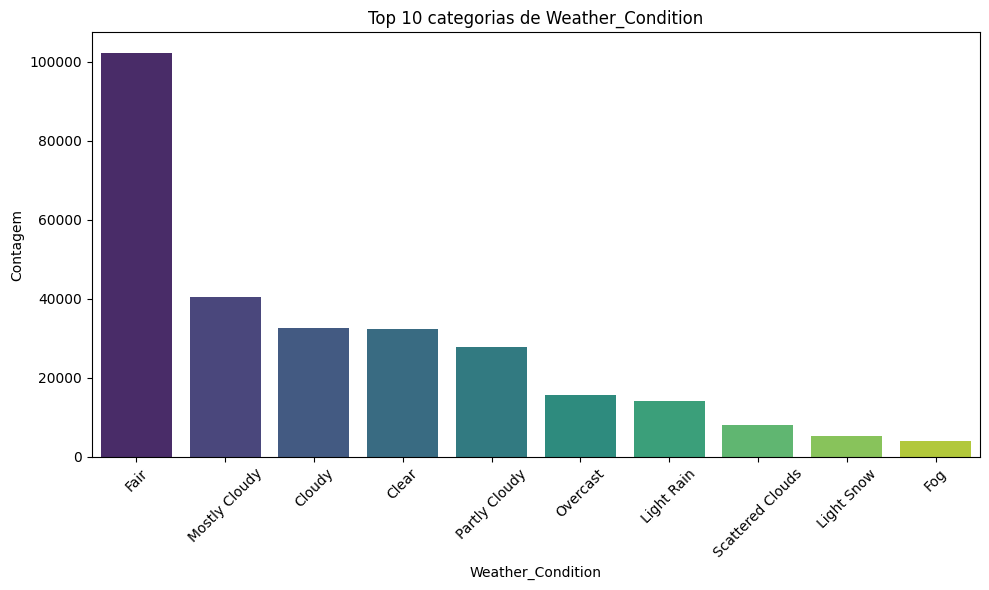

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


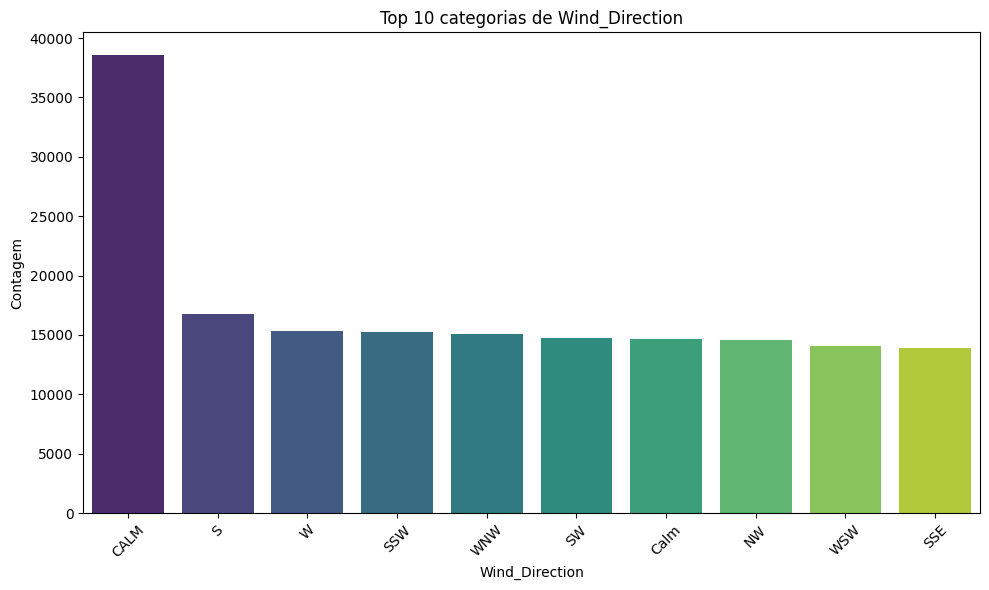

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


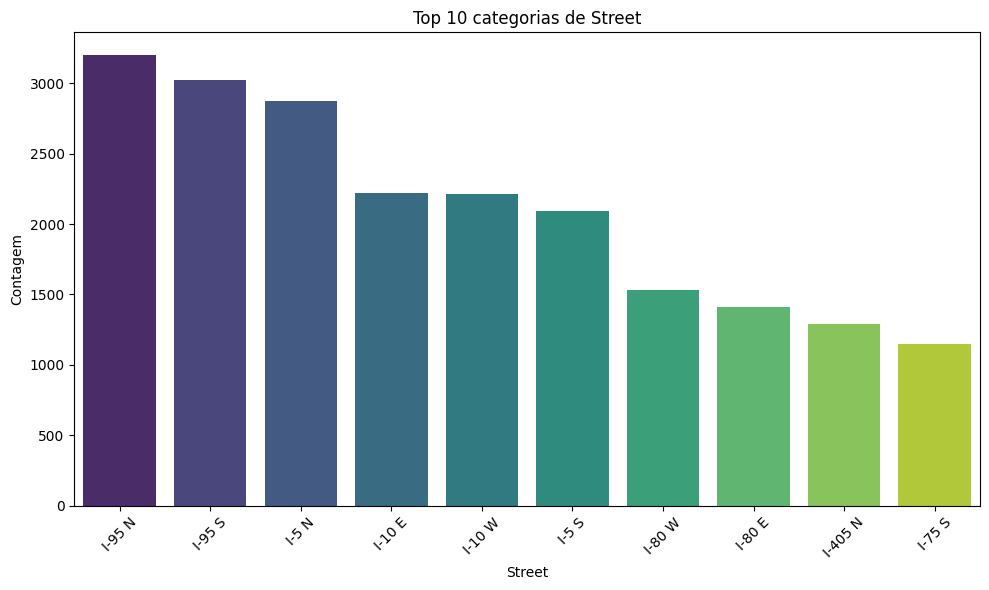

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


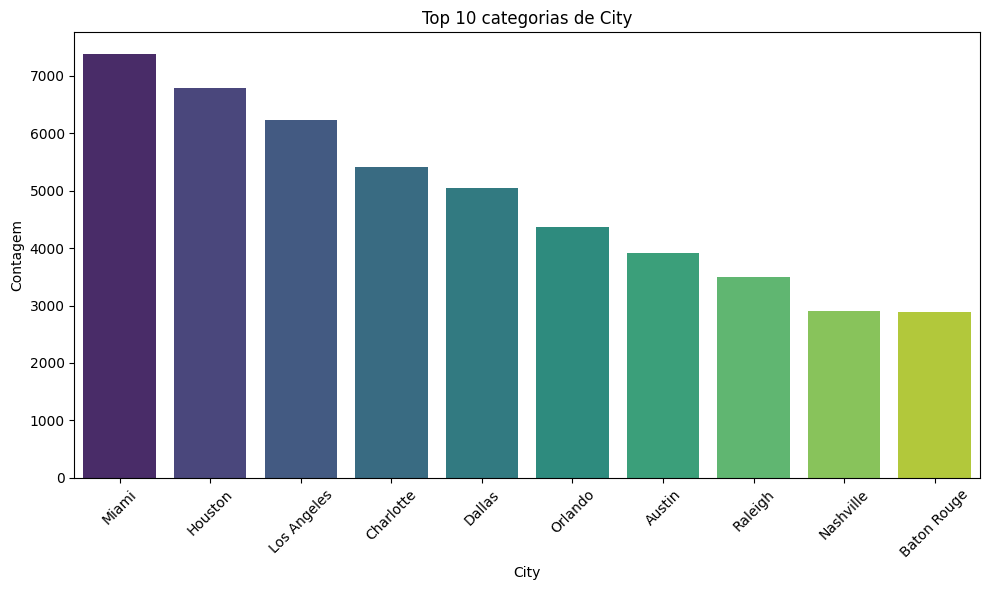

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


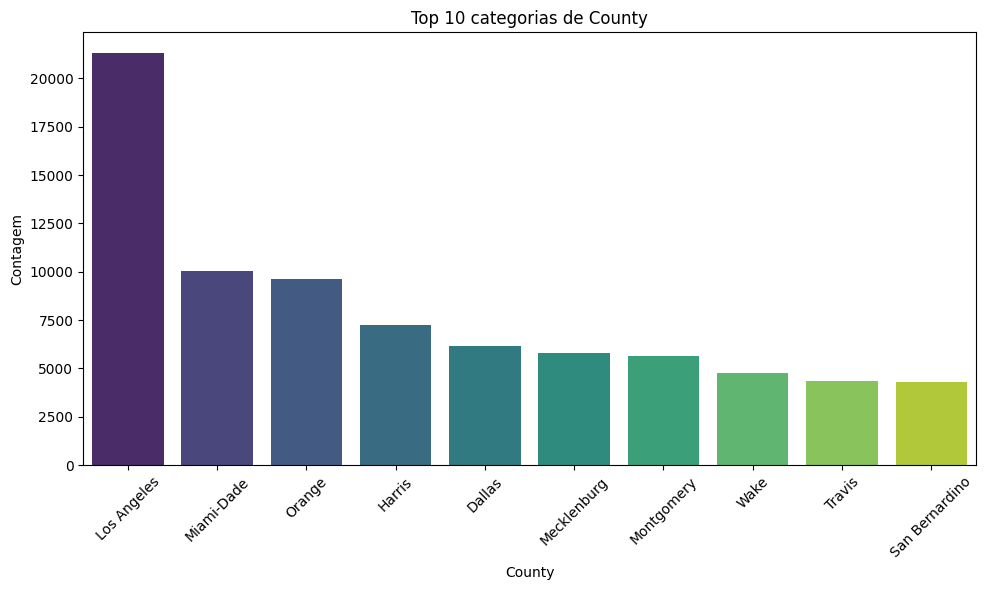

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


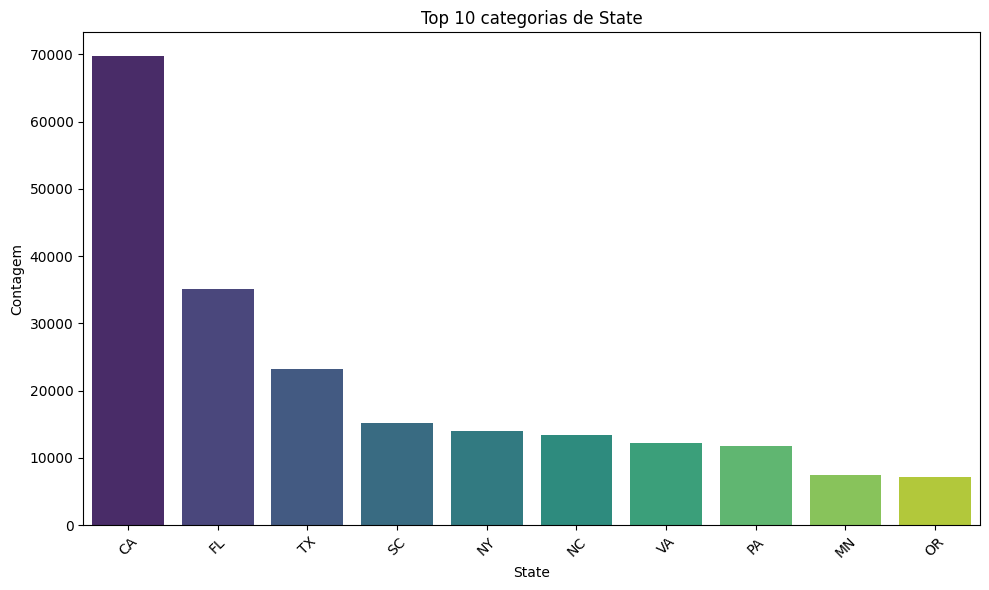

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


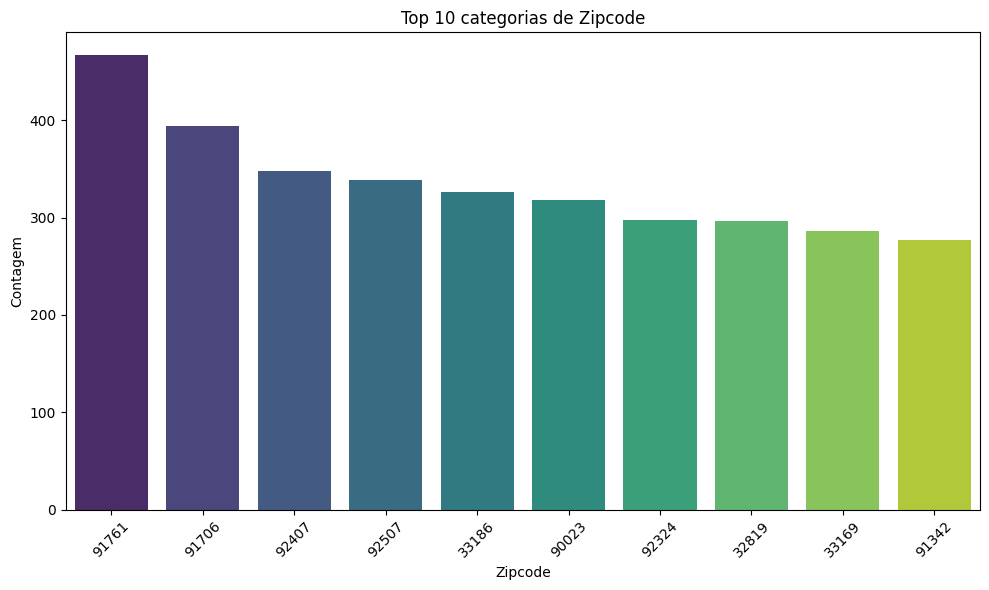

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


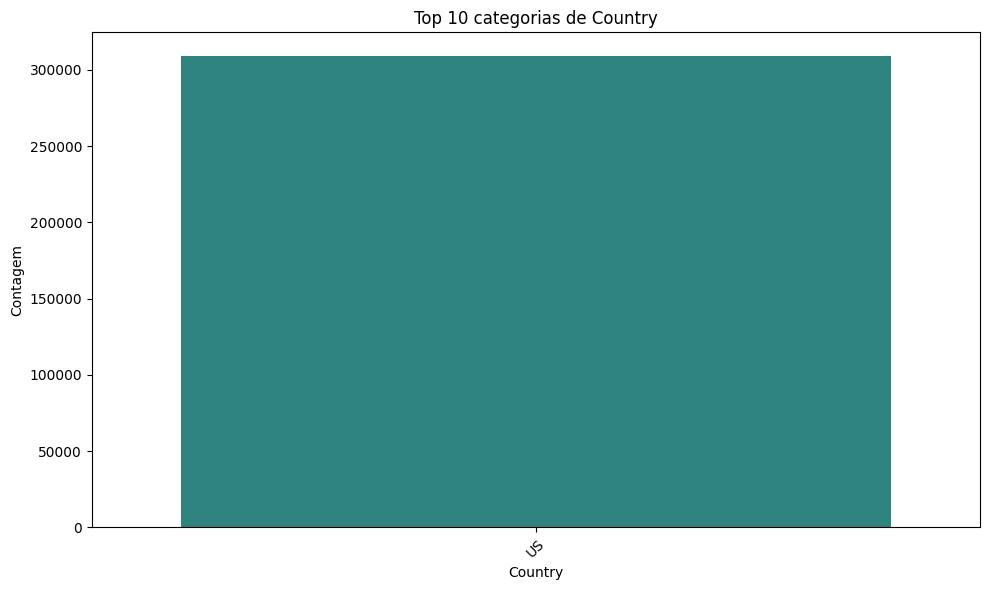

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


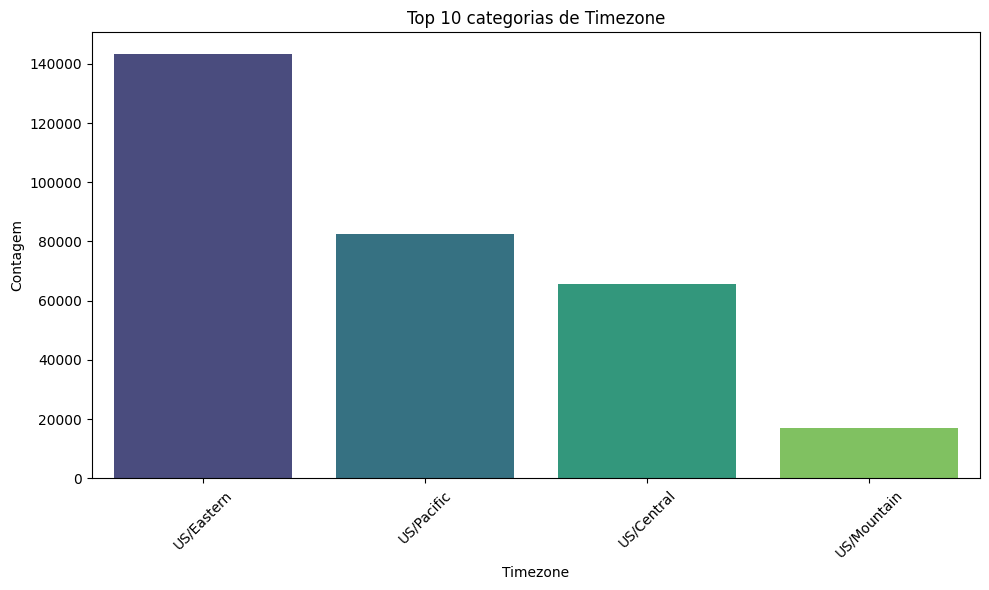

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


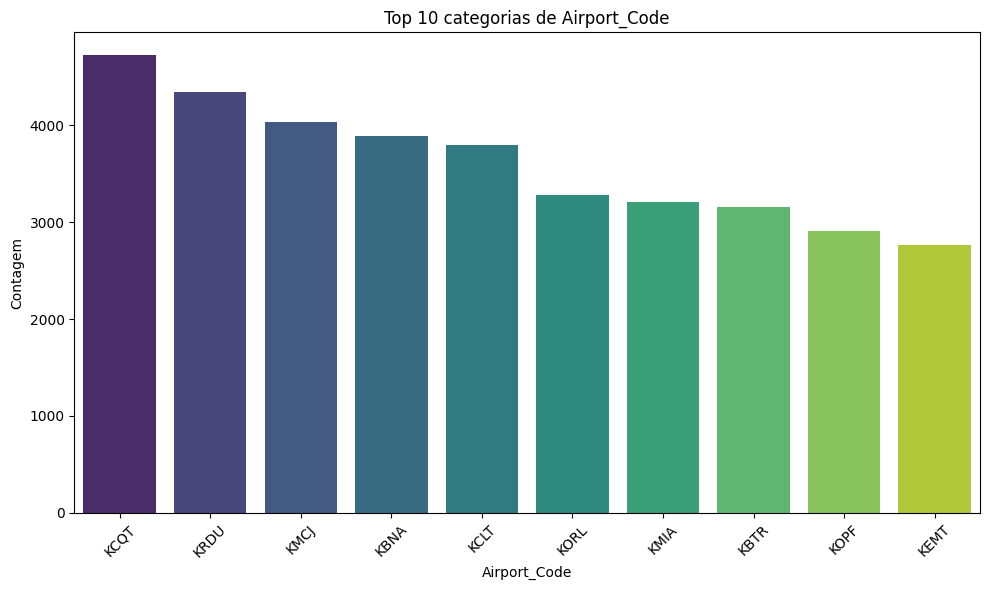

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


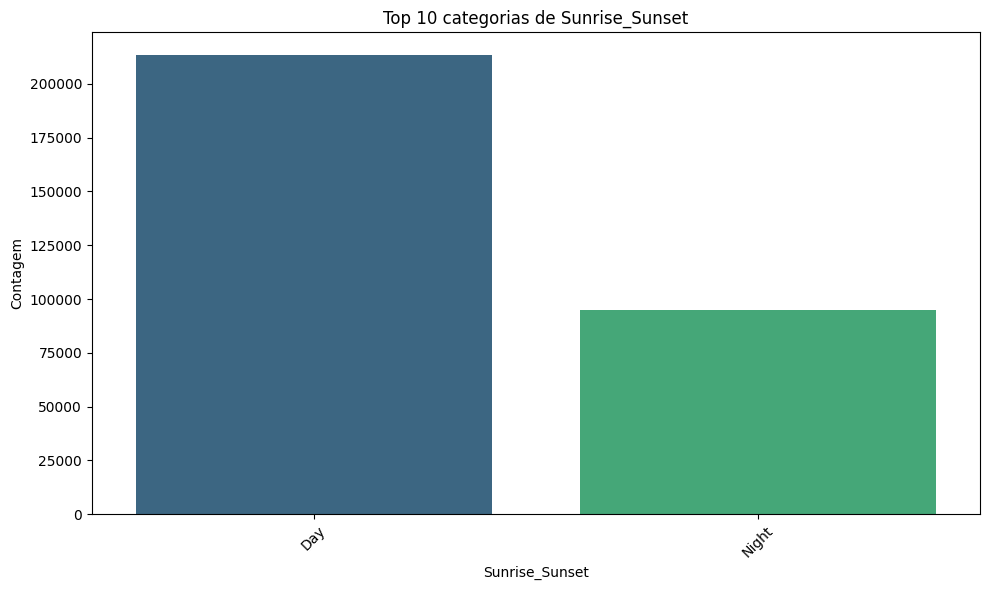

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


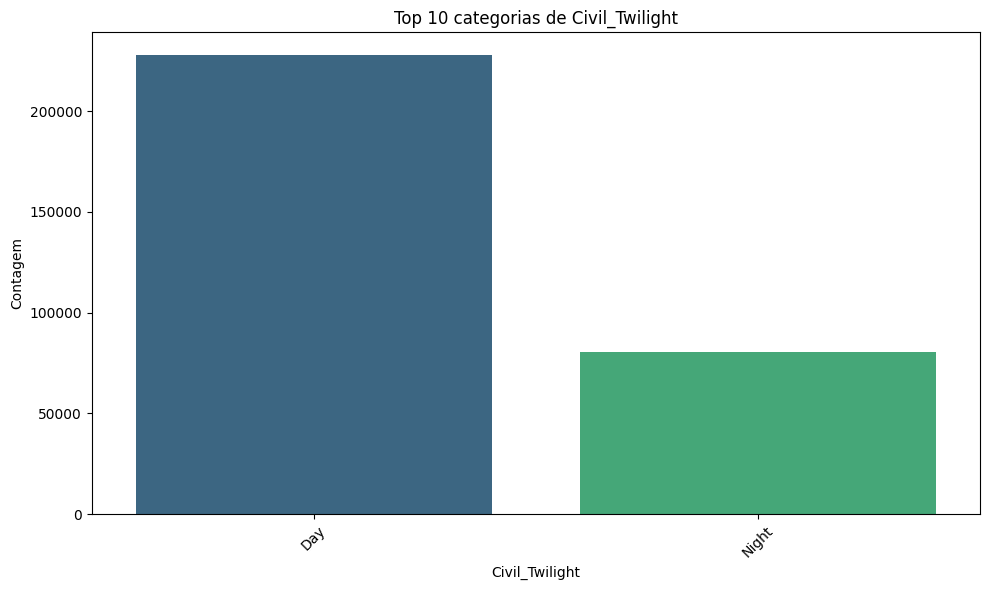

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


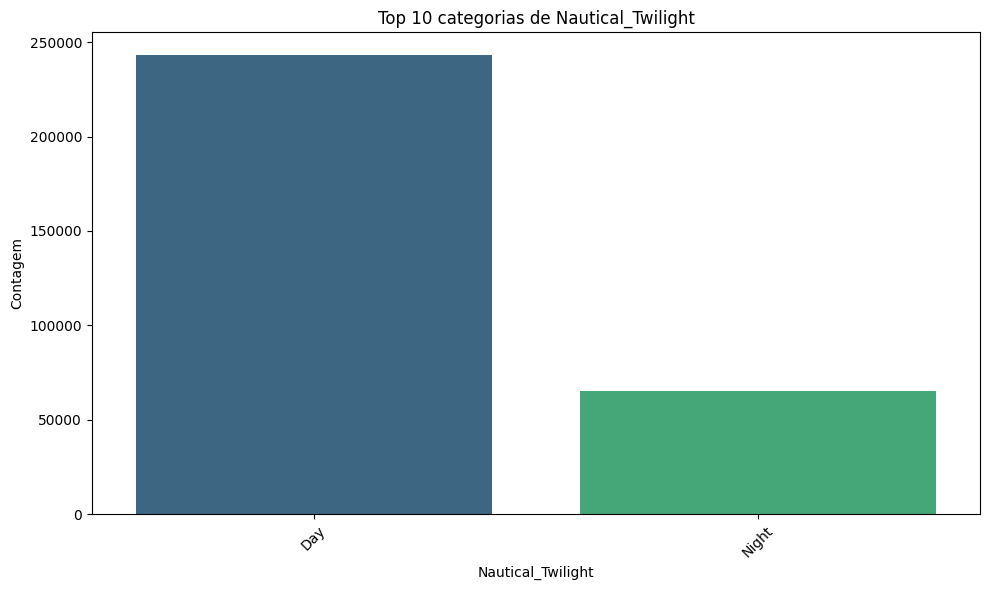

/tmp/ipykernel_31471/3724147836.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


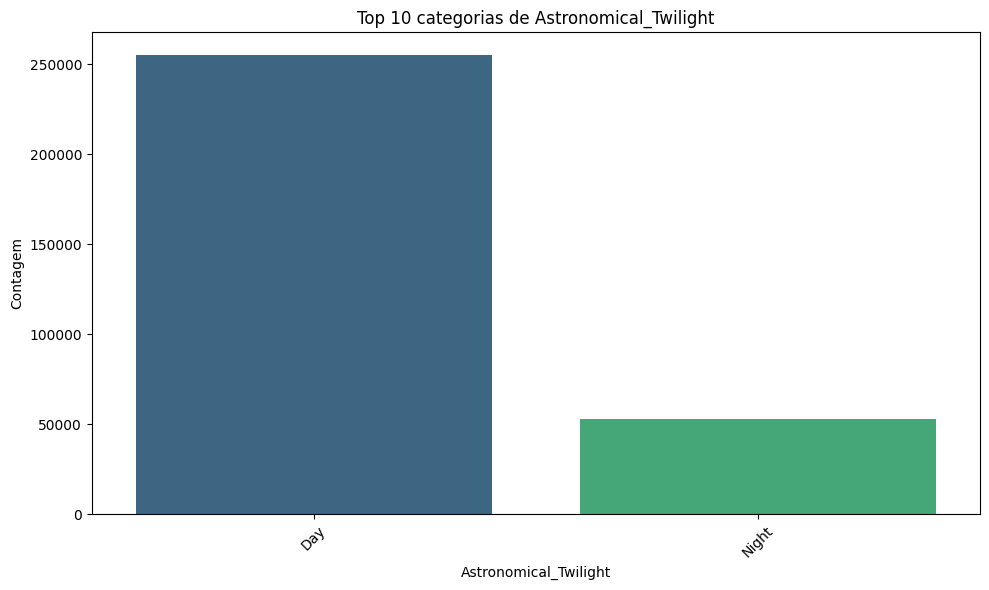

In [ ]:
for col in cat_cols:

    plt.figure(figsize=(10, 6))

    top_values = X_train_pd[col].value_counts().nlargest(10).index

    sns.countplot(
        data=X_train_pd[X_train_pd[col].isin(top_values)],
        x=col,
        order=top_values,
        palette='viridis'
    )

    plt.title(f'Top 10 categorias de {col}')
    plt.xlabel(col)
    plt.ylabel('Contagem')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

#### **Conclusões**

Após a análise categórica univariada foi possível fazer algumas conclusões:

- **Baixa Cardinalidade - manter**
    - State
    - Timezone
    - Features Twilight (manter 1)

- **Alta Cardinalidade - transformar**
    - Weather_Condition
    - Wind_Direction
    - City
    - Airport_Code

- **Extrema Cardinalidade - remover**
    - Street
    - County
    - Zipcode
    - Country (1 cardinalidade)

---

#### **1. Weather_Condition (97 categorias)**

- Possui alta cardinalidade, categorias raras e redundância semântica
- A estratégia é agrupar categorias de climas para reduzir as categorias
- de 97 para 9 categorias
- ```python
    def agrupar_clima(x):
        if pd.isna(x):
            return 'Unknown'
        
        x = x.lower()
        
        # storm (mais severo primeiro)
        if 'thunder' in x or 't-storm' in x or 'storm' in x:
            return 'Storm'
        
        # snow / gelo
        elif any(word in x for word in ['snow', 'sleet', 'ice', 'freezing']):
            return 'Snow'
        
        # chuva
        elif any(word in x for word in ['rain', 'drizzle', 'shower']):
            return 'Rain'
        
        # neblina / baixa visibilidade
        elif any(word in x for word in ['fog', 'mist', 'haze']):
            return 'Fog'
        
        # vento explícito
        elif 'windy' in x or 'squalls' in x:
            return 'Windy'
        
        # nuvens
        elif any(word in x for word in ['cloud', 'overcast']):
            return 'Clouds'
        
        # céu limpo
        elif any(word in x for word in ['clear', 'fair']):
            return 'Clear'
        
        # fallback
        else:
            return 'Other'
- ```python
    X_train_pd['Weather_Grouped'] = X_train_pd['Weather_Condition'].apply(agrupar_clima)

    X_train_pd['Weather_Grouped'].value_counts(normalize=True)
---

#### **2. Wind_Direction (24 categorias)**

- Existem duplicatas semânticas (Ex: CALM e Calm, S e South, etc).
- Direção é circular, portanto é possível transformar as categorias em valores contínuos por meio da angulação (seno e cosseno).
- A vantagem dessa estratégia é reduzir a dimensionalidade de aproximadamente 10 features usando encoding para 2 features (seno e cosseno). Nesse caso CALM e REGULAR vão ter valores NAN para os campos de seno e cosseno.
- ```python
     direcao_para_graus = {
        'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5,
        'E': 90, 'ESE': 112.5, 'SE': 135, 'SSE': 157.5,
        'S': 180, 'SSW': 202.5, 'SW': 225, 'WSW': 247.5,
        'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
     }

     def converter_direcao(x):
        if pd.isna(x):
            return np.nan
        
        x = x.upper()
        
        if x in ['CALM', 'VAR', 'VARIABLE']:
            return np.nan
        
        if x in ['NORTH']: x = 'N'
        if x in ['SOUTH']: x = 'S'
        if x in ['EAST']: x = 'E'
        if x in ['WEST']: x = 'W'
        
        return direcao_para_graus.get(x, np.nan)
- ```python
     # 1. converter para graus
     X_train_pd['wind_deg'] = X_train_pd['Wind_Direction'].apply(converter_direcao)

     # 2. transformar
     X_train_pd['wind_sin'] = np.sin(np.radians(X_train_pd['wind_deg']))
     X_train_pd['wind_cos'] = np.cos(np.radians(X_train_pd['wind_deg']))

     # 4. remover colunas antigas
     X_train_pd.drop(columns=['Wind_Direction', 'wind_deg'], inplace=True)

---

#### **3. Street (66k categorias)**

- Cardinalidade muito alta.
- A melhor estratégia é remover.
- ```python
     X_train_pd.drop(columns=['Street'])

---

#### **4. City (8608 categorias)**

- Uma estratégia seria selecionar top N cidades e o restante considerar como "Other".
- Mas apesar de trazer informações importantes de cidades que representam grandes centros urbanos, selecionar top N pode trazer um viés para "Other".
- Então para evitar explosão de dimensionalidade e viés, a melhor estratégia é remover a feature.
- ```python
     X_train_pd.drop(columns=['City'])

---

#### **5. County (1508 categorias)**

- Alta Cardinalidade.
- Redundante.
- Melhor estratégia é remover.
- ```python
     X_train_pd.drop(columns=['County'])

---

#### **6. State (49 categorias)**

- Traz mais interpretabilidade, mas 49 categorias ainda é uma quantidade considerável.
- Uma alternativa para isso é utilizar clusterização com coordenadas de latitude e longitude.
- Pode remover uma quantidade significativa de categorias, mantendo boa interpretabilidade sem aumentar muito a dimensionalidade.
- ```python
     from sklearn.cluster import KMeans

     # criar clusters
     kmeans = KMeans(n_clusters=15, random_state=42)

     X_train_pd['geo_cluster'] = kmeans.fit_predict(
        X_train_pd[['Start_Lat', 'Start_Lng']]
     )

     X_train_pd.drop(columns=['State']

---

#### **7. Zipcode (87k categorias)**

- Cardinalidade muito alta.
- A melhor estratégia é remover.
- ```python
     X_train_pd.drop(columns=['Zipcode'])

---

#### **8. Country (1 categoria)**

- Somente tem uma categoria "US".
- Esse atributo não vai agregar para o modelo, a melhor estratégia é remover.
- ```python
     X_train_pd.drop(columns=['Country'])

---

#### **9. Timezone (4 categorias)**

- Poucas categorias e pode ser relevante temporalmente.
- Melhor manter.

---

#### **10. Airport_Code (1817 categorias)**

- Cardinalidade muito alta.
- A melhor estratégia é remover.
- ```python
     X_train_pd.drop(columns=['Airport_Code'])

---

#### **11. Twilight features (4 colunas)**

- Quatro atributos altamente correlacionados e redundantes:
    - Sunrise_Sunset
    - Civil_Twilight
    - Nautical_Twilight
    - Astronomical_Twilight
- A melhor estratégia é manter apenas um (Ex: Sunrise_Sunset)
- ```python
     X_train_pd.drop(columns=['Civil_Twilight'])
     X_train_pd.drop(columns=['Nautical_Twilight'])
     X_train_pd.drop(columns=['Astronomical_Twilight'])

### Binárias

In [ ]:
poi_cols = [
    'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction',
    'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
    'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'
]

for col in poi_cols:
    print(X_train_pd[col].value_counts(normalize=True))

Amenity
False    0.987581
True     0.012419
Name: proportion, dtype: float64
Bump
False    0.999537
True     0.000463
Name: proportion, dtype: float64
Crossing
False    0.888117
True     0.111883
Name: proportion, dtype: float64
Give_Way
False    0.995293
True     0.004707
Name: proportion, dtype: float64
Junction
False    0.925961
True     0.074039
Name: proportion, dtype: float64
No_Exit
False    0.997357
True     0.002643
Name: proportion, dtype: float64
Railway
False    0.991447
True     0.008553
Name: proportion, dtype: float64
Roundabout
False    0.999964
True     0.000036
Name: proportion, dtype: float64
Station
False    0.973937
True     0.026063
Name: proportion, dtype: float64
Stop
False    0.972598
True     0.027402
Name: proportion, dtype: float64
Traffic_Calming
False    0.999013
True     0.000987
Name: proportion, dtype: float64
Traffic_Signal
False    0.853142
True     0.146858
Name: proportion, dtype: float64
Turning_Loop
False    1.0
Name: proportion, dtype: float64


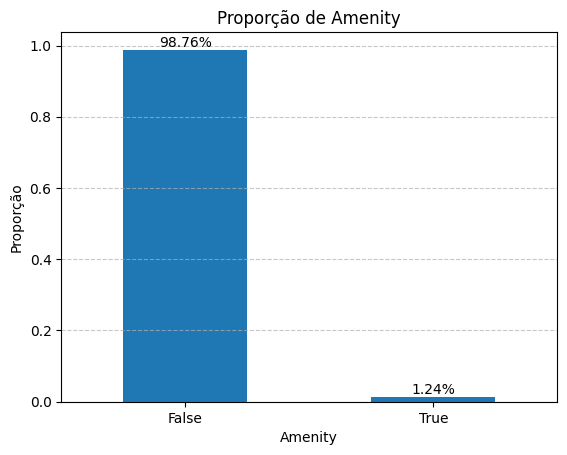

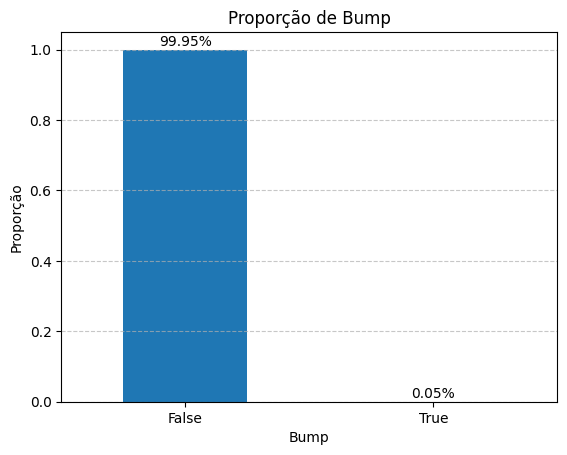

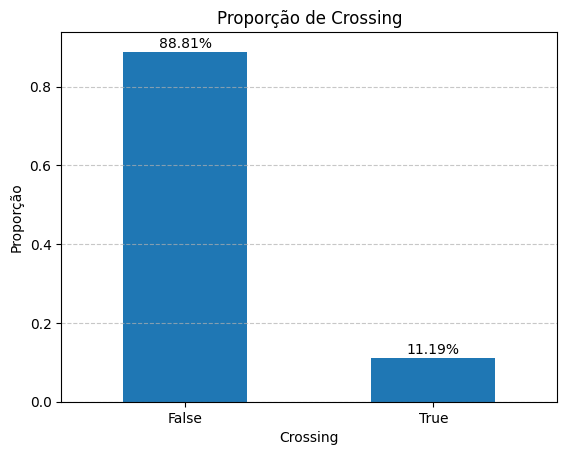

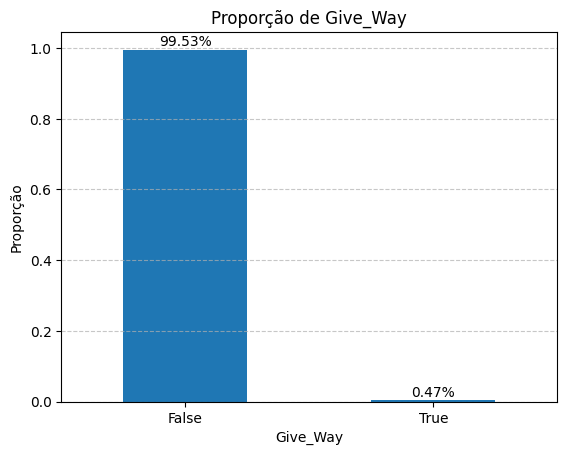

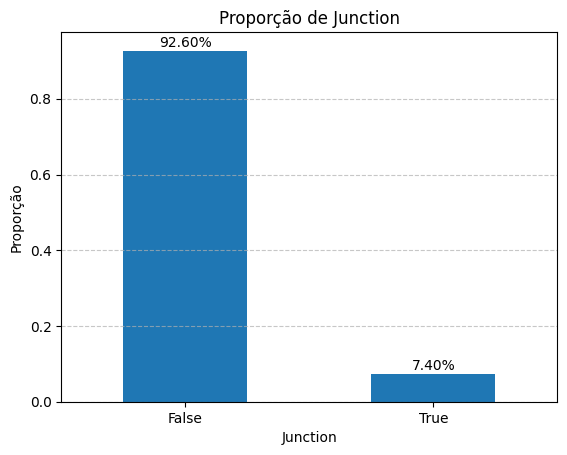

...

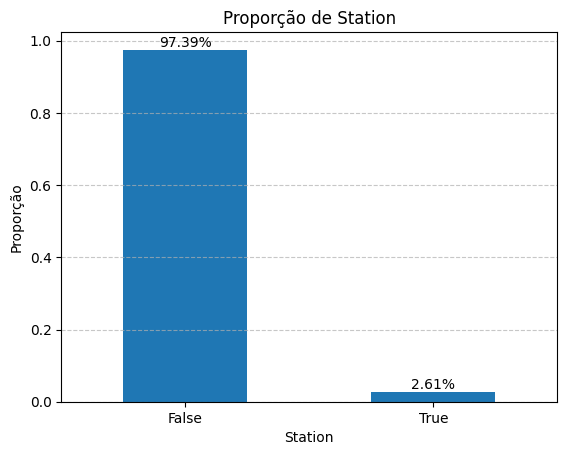

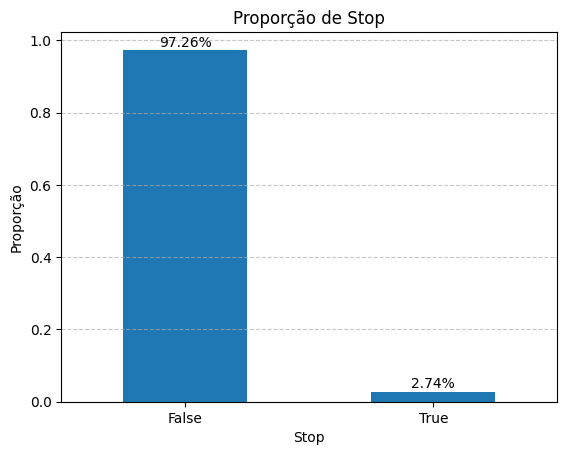

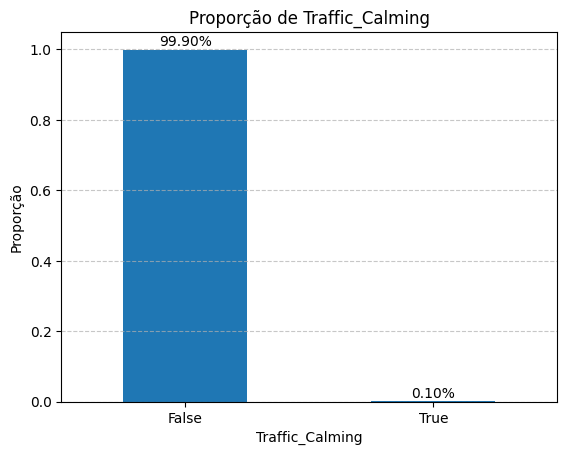

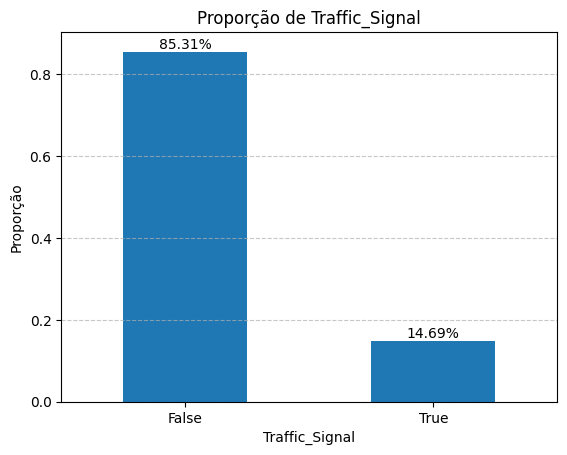

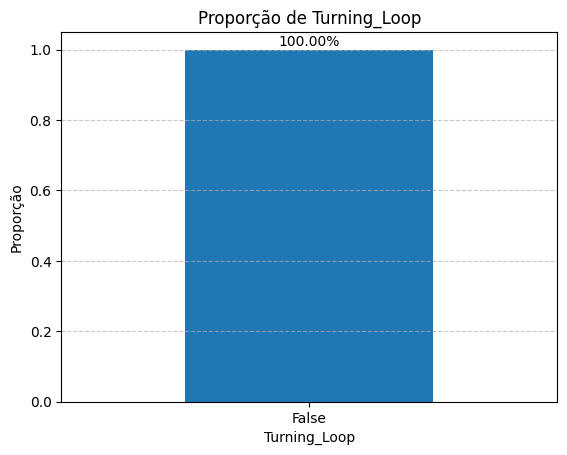

In [ ]:
for col in poi_cols:
    prop = X_train_pd[col].value_counts(normalize=True)

    ax = prop.plot(kind='bar')

    for i, v in enumerate(prop):
        ax.text(i, v + 0.01, f"{v*100:.2f}%", ha='center')

    plt.title(f'Proporção de {col}')
    plt.ylabel('Proporção')
    plt.xticks(rotation=0)
    plt.ylim(0, prop.max() + 0.05)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

Após a análise univariada de atributos binários foi possível fazer algumas conslusões:

- Tiveram features extremamente raras ou inexistentes:
    - Turning_Loop (0%)
    - Roundabout (0.0036%)
    - Bump (0.046%)
    - Traffic_Calming (0.098%)
    - No_Exit (0.26%)
    - Give_Way (0.47%)
- Esses atributos por ter pouca incidência, podem ter pouca representatividade e ter um eventual risco de overfitting. Nesse caso a melhor estratégia pode ser removê-las
- Outras features tiveram frequências baixas, mas que ainda precisam passar uma análise bivariada em relação a variável alvo:
    - Railway (0.86%)
    - Amenity (1.24%)
    - Station (2.61%)
    - Stop (2.74%)
    - Junction (7.4%)
    - Crossing (11.19%)
    - Traffic_Sinal (14.69%)
- Essas features podem ter uma correlação com a severidade dos acidentes. É necessário investigar mais antes de tomar uma decisão.

## 4. Análise Bivariada

### Numérica x Target

Axes(0.125,0.11;0.62x0.77)


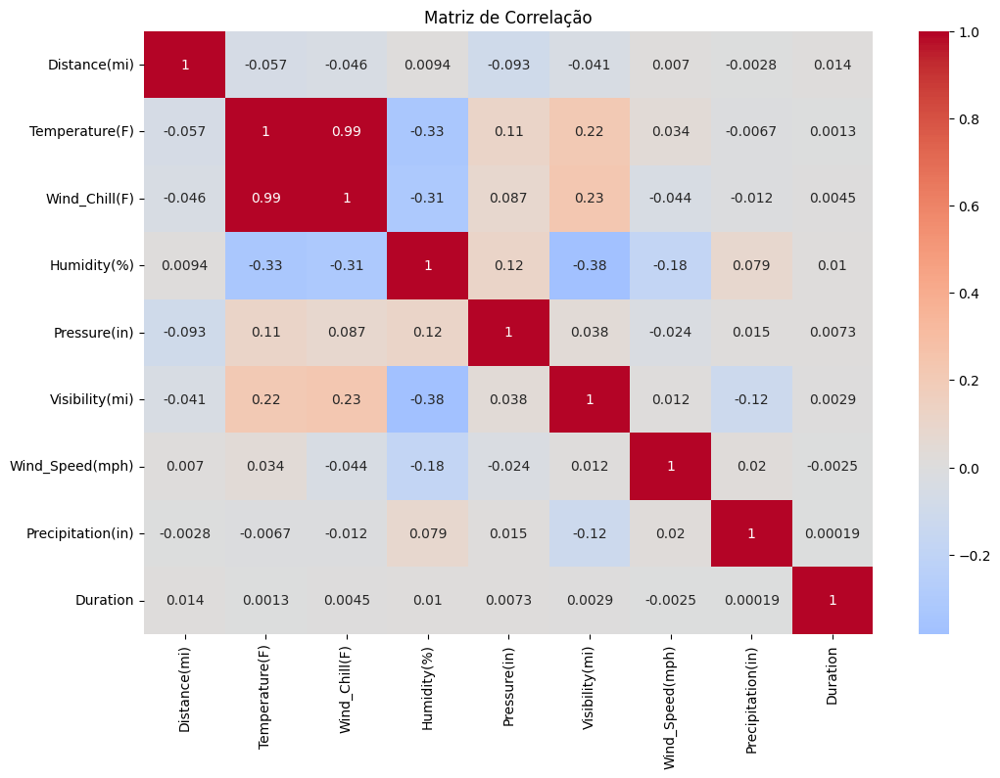

In [ ]:
num_cols = X_train_pd.select_dtypes(include=['int64', 'float64']).columns

corr = X_train_pd[num_cols].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlação')
plt.show()

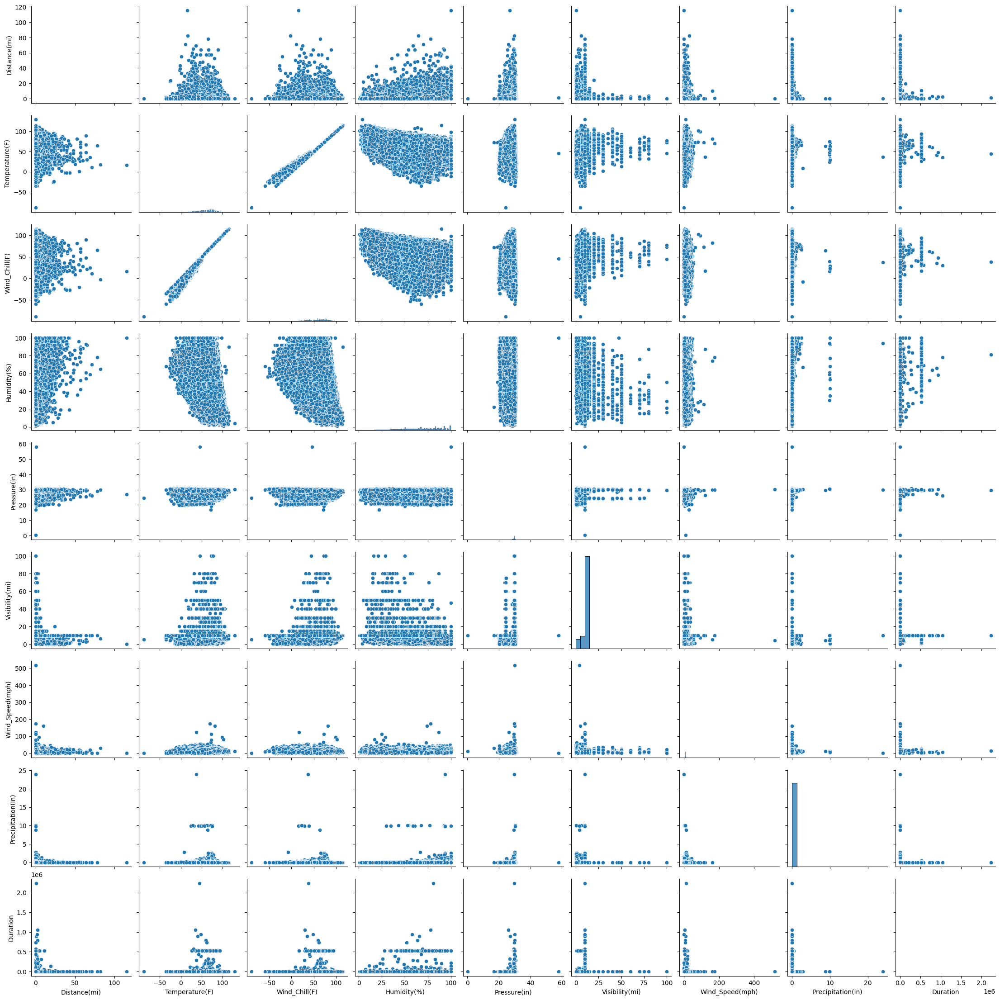

In [ ]:
sns.pairplot(df_temp[num_cols])

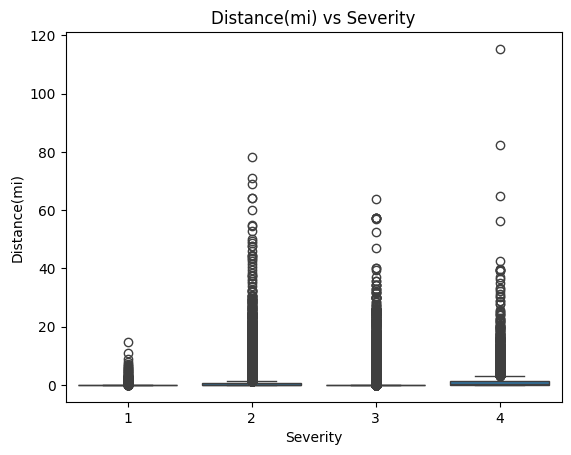

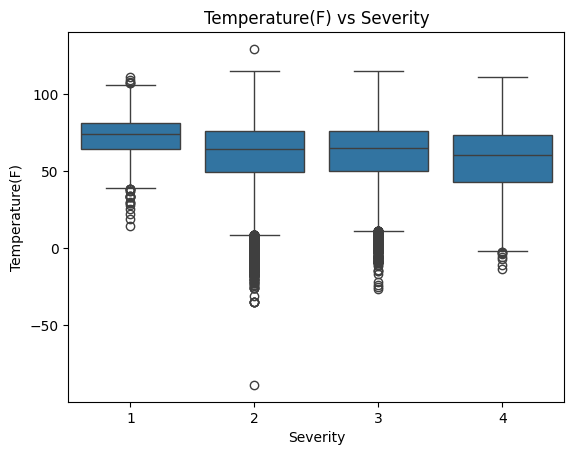

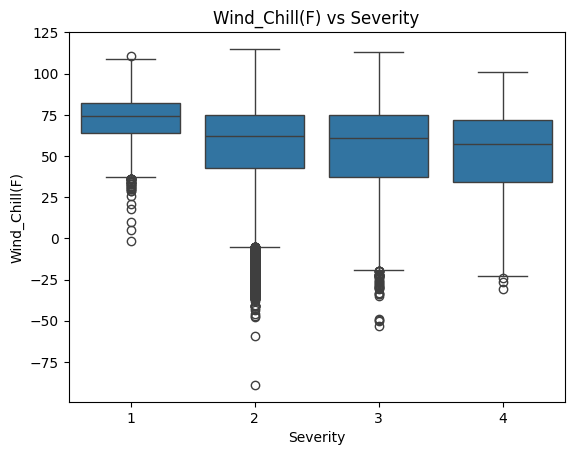

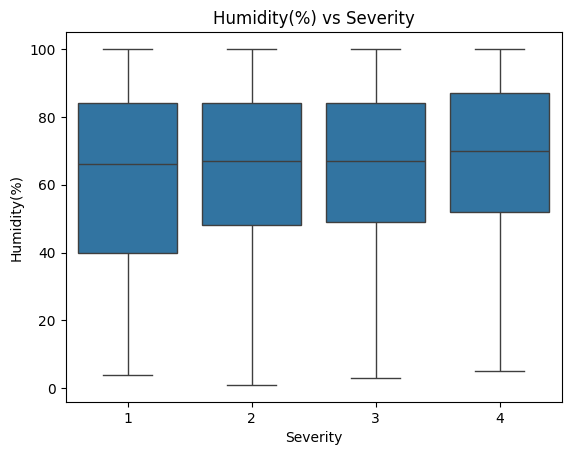

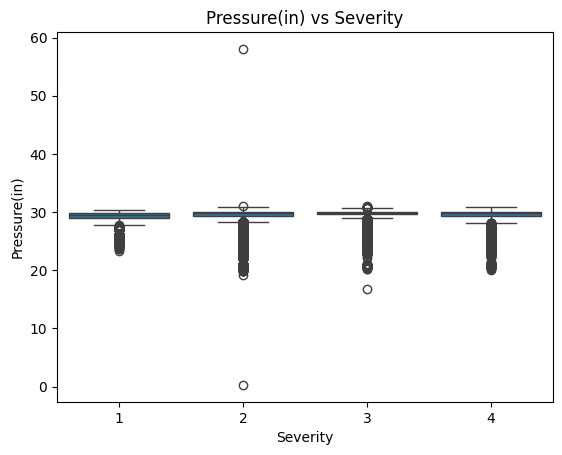

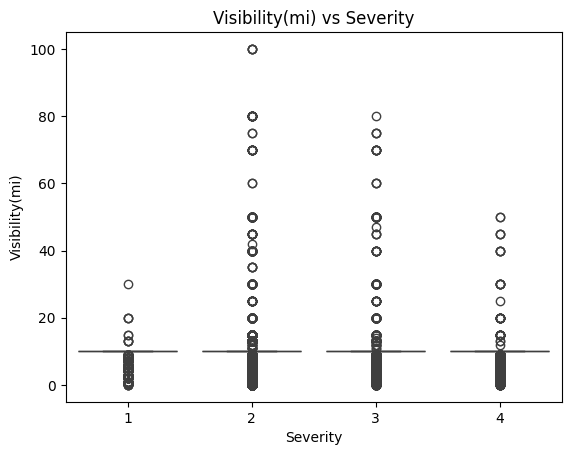

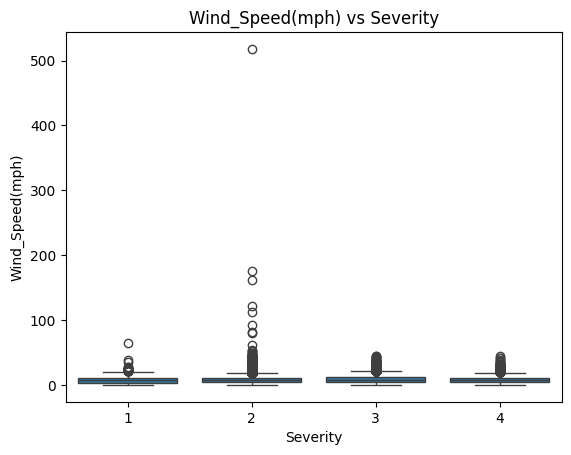

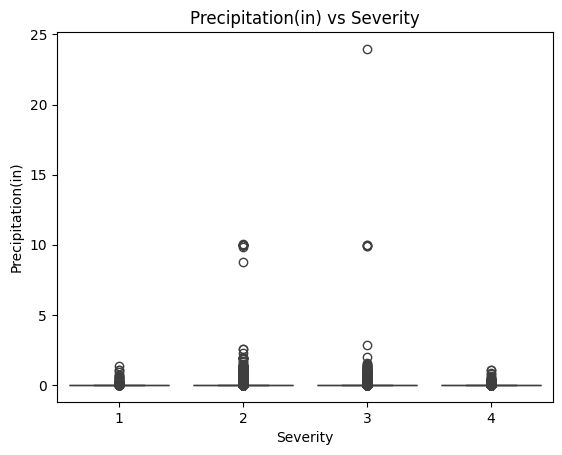

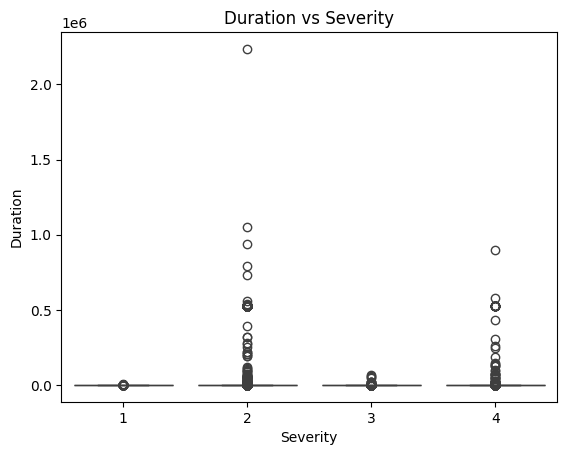

In [ ]:
for col in num_cols:
    sns.boxplot(data=df_temp, x='Severity', y=col)
    plt.title(f'{col} vs Severity')
    plt.show()

In [ ]:
df_temp = X_train_pd[num_cols].copy()
df_temp['Severity'] = y_train_pd.values

corr_target = df_temp.corr()['Severity'].sort_values(ascending=False)

corr_target

,Severity
Severity,1.000000
Pressure(in),0.040251
Wind_Speed(mph),0.040076
Distance(mi),0.034177
Humidity(%),0.022459
Precipitation(in),0.019092
Duration,0.001813
Visibility(mi),-0.002850
Temperature(F),-0.019954
Wind_Chill(F),-0.071570


#### Conclusões

---

##### Matriz de Correlação + Gráficos + Boxplots

- Temperature e Wind_Chill possuem alta correlação, o que faz sentido pois Wind_Chil é derivado das condições climáticas de temperatura e vento.
    - Nesse caso, é possível remover um dos dois atributos.

- Temperature e Humidity possuem correlação inversa, ou seja, maiores temperaturas tendem a ter menor umidade.

- Consequentemente, a visibilidade tem uma relação direta com temperatura e umidade. Os dados mostraram exatamente isso, quanto mais calor, menor será a umidade e melhor será visibilidade.

- Precipitação teve uma correlação muito fraca com todos os atributos
    - Provavelmente por baixa precisão e possíveis erros.
    - Talvez após limpeza dos dados, melhore.

- Wind_Speed teve uma correlação muito fraca com todos, porvavelmente tem um efeito não linear ou contextual.

- Distance teve correlação praticamente nula com todos, provavelmente é uma feature independente.

- Duration também teve correlação muito fraca, mas já foi identificado ruídos nesse atributo. É necessário avaliar após limpeza de dados.

- Pressure teve baixo impacto.

---

##### Correlação com Variável Alvo

- Nenhuma variável numérica possui relação linear forte com Severity.
- Isso não significa que as variáveis são descartáveis, a questão é que o problema é não linear e multifatorial.
- A severidade do acidente depende do contexto da via, interação entre variáveis e até fatores não observados.

---
#### Decisões

- Remover:
    - Wind_Chill

- Manter (alto impacto):
    - Temperature
    - Humidity
    - Visibility
    - Distance

- Manter (baixo impacto):
    - Wind_Speed
    - Pressure

- Avaliar após limpeza de dados:
    - Precipitation
    - Duration

- Como a análise dos atributos revelaram um problema não linear, talvez vale a pena criar features não lineares:
    - ```python
        X_train_pd['low_visibility'] = (X_train_pd['Visibility(mi)'] < 5).astype(int)
        X_train_pd['high_humidity'] = (X_train_pd['Humidity(%)'] > 80).astype(int)
        X_train_pd['is_rain'] = (X_train_pd['Precipitation(in)'] > 0).astype(int)
    - ```python
         X_train_pd['bad_weather'] = (X_train_pd['low_visibility'] & X_train_pd['is_rain']).astype(int)

- Usar modelos não lineares baseados em árvores podem ter melhores resultados:
    - Random Forest
    - XGBoost
    - LightGBM

### Categórica x Target

In [ ]:
def agrupar_clima(x):
    if pd.isna(x):
        return 'Unknown'

    x = x.lower()

    # storm (mais severo primeiro)
    if 'thunder' in x or 't-storm' in x or 'storm' in x:
        return 'Storm'

    # snow / gelo
    elif any(word in x for word in ['snow', 'sleet', 'ice', 'freezing']):
        return 'Snow'

    # chuva
    elif any(word in x for word in ['rain', 'drizzle', 'shower']):
        return 'Rain'

    # neblina / baixa visibilidade
    elif any(word in x for word in ['fog', 'mist', 'haze']):
        return 'Fog'

    # vento explícito
    elif 'windy' in x or 'squalls' in x:
        return 'Windy'

    # nuvens
    elif any(word in x for word in ['cloud', 'overcast']):
        return 'Clouds'

    # céu limpo
    elif any(word in x for word in ['clear', 'fair']):
        return 'Clear'

    # fallback
    else:
        return 'Other'

In [ ]:
X_train_pd['weather_Grouped'] = X_train_pd['Weather_Condition'].apply(agrupar_clima)
X_train_pd.drop(columns=['Weather_Condition'], inplace=True)

X_train_pd['weather_Grouped'].value_counts(normalize=True)

,proportion
weather_Grouped,
Clear,0.435632
Clouds,0.403607
Rain,0.066191
Fog,0.024362
Unknown,0.022751
Snow,0.021887
Storm,0.011435
Windy,0.010449
Other,0.003688


In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=X_train_pd, x='weather_Grouped', y='Severity')
plt.title('Duração do Acidente por Condição Climática')
plt.xticks(rotation=45)
plt.show()

ValueError: Could not interpret value `Severity` for `y`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

In [ ]:
plt.figure(figsize=(8,5))
sns.boxplot(data=X_train_pd, x='Sunrise_Sunset', y='duration')
plt.title('Duração por Período do Dia')
plt.show()

ValueError: Could not interpret value `duration` for `y`. An entry with this name does not appear in `data`.

<Figure size 800x500 with 0 Axes>

In [ ]:
cat_cols = [
    'weather_Grouped', 'Wind_Direction', 'Street',
    'City', 'County', 'State', 'Zipcode', 'Country',
    'Timezone', 'Airport_Code', 'Sunrise_Sunset',
    'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight'
]

In [ ]:
for col in cat_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    # pegar top 10 categorias mais frequentes
    top_10 = df_temp[col].value_counts().nlargest(10).index

    # filtrar dataframe
    df_filtered = df_temp[df_temp[col].isin(top_10)]

    # crosstab
    table = pd.crosstab(
        df_filtered[col],
        df_filtered['Severity'],
        normalize='index'
    )

    display(
        table.style
        .format("{:.2%}")
        .background_gradient(cmap='coolwarm')
    )

Severity,1,2,3,4
weather_Grouped,,,,
Clear,1.04%,81.93%,14.46%,2.56%
Clouds,0.81%,77.32%,19.28%,2.60%
Fog,0.54%,84.33%,13.05%,2.07%
Other,0.09%,85.18%,10.61%,4.12%
Rain,0.55%,76.63%,20.32%,2.50%
Snow,0.07%,78.82%,17.06%,4.05%
Storm,1.78%,77.03%,19.24%,1.95%
Unknown,0.61%,78.50%,16.66%,4.22%
Windy,1.24%,84.74%,11.27%,2.76%


Severity,1,2,3,4
Wind_Direction,,,,
CALM,1.10%,87.47%,8.78%,2.65%
Calm,0.03%,65.48%,31.13%,3.35%
NW,0.79%,79.67%,16.89%,2.65%
S,1.41%,84.32%,11.93%,2.34%
SSE,0.71%,79.19%,17.71%,2.39%
SSW,1.11%,77.95%,18.07%,2.86%
SW,1.11%,77.95%,17.81%,3.13%
W,1.33%,85.07%,11.26%,2.34%
WNW,0.82%,79.02%,17.54%,2.63%


Severity,1,2,3,4
Street,,,,
I-10 E,0.36%,62.26%,35.93%,1.44%
I-10 W,0.27%,60.13%,37.84%,1.76%
I-405 N,0.08%,56.44%,42.86%,0.62%
I-5 N,0.14%,66.32%,32.53%,1.01%
I-5 S,0.19%,74.32%,24.53%,0.96%
I-75 S,0.44%,50.91%,45.17%,3.48%
I-80 E,0.57%,61.99%,34.47%,2.98%
I-80 W,0.85%,58.72%,37.69%,2.74%
I-95 N,0.44%,59.06%,37.95%,2.56%


Severity,1,2,3,4
City,,,,
Austin,0.59%,90.70%,8.38%,0.33%
Baton Rouge,1.80%,89.22%,8.50%,0.48%
Charlotte,1.63%,92.62%,5.16%,0.59%
Dallas,0.97%,72.61%,25.49%,0.93%
Houston,0.28%,81.59%,17.38%,0.75%
Los Angeles,0.24%,76.89%,22.24%,0.63%
Miami,0.07%,90.81%,7.80%,1.33%
Nashville,1.62%,83.06%,14.56%,0.76%
Orlando,0.89%,92.65%,5.38%,1.08%


Severity,1,2,3,4
County,,,,
Dallas,0.83%,69.75%,28.36%,1.07%
Harris,0.29%,80.98%,17.86%,0.87%
Los Angeles,0.16%,77.75%,21.37%,0.73%
Mecklenburg,1.58%,92.08%,5.56%,0.78%
Miami-Dade,0.06%,92.16%,6.62%,1.16%
Montgomery,0.85%,85.06%,11.96%,2.13%
Orange,0.58%,87.40%,11.07%,0.95%
San Bernardino,0.14%,81.46%,17.82%,0.58%
Travis,0.69%,90.48%,8.53%,0.30%


Severity,1,2,3,4
State,,,,
CA,0.60%,83.07%,15.57%,0.76%
FL,0.90%,85.91%,11.64%,1.55%
MN,0.27%,83.04%,16.21%,0.48%
NC,1.40%,86.66%,8.87%,3.07%
NY,0.35%,76.92%,19.51%,3.22%
OR,0.81%,90.19%,5.55%,3.44%
PA,0.56%,83.32%,10.82%,5.30%
SC,1.53%,87.06%,10.71%,0.69%
TX,0.70%,77.21%,20.90%,1.19%


Severity,1,2,3,4
Zipcode,,,,
32819,0.00%,83.45%,15.20%,1.35%
33169,0.00%,70.98%,24.13%,4.90%
33186,0.00%,98.47%,1.23%,0.31%
90023,0.31%,72.33%,26.42%,0.94%
91342,0.00%,63.90%,35.38%,0.72%
91706,0.00%,60.91%,38.07%,1.02%
91761,0.00%,80.09%,19.49%,0.43%
92324,0.00%,69.13%,30.87%,0.00%
92407,0.29%,75.57%,22.99%,1.15%


Severity,1,2,3,4
Country,,,,
US,0.88%,79.62%,16.87%,2.63%


Severity,1,2,3,4
Timezone,,,,
US/Central,0.76%,76.69%,20.54%,2.01%
US/Eastern,0.88%,79.18%,16.33%,3.60%
US/Mountain,2.50%,78.58%,15.06%,3.86%
US/Pacific,0.64%,82.88%,15.31%,1.18%


Severity,1,2,3,4
Airport_Code,,,,
KBNA,1.72%,82.51%,14.74%,1.03%
KBTR,1.68%,88.93%,8.79%,0.60%
KCLT,1.63%,91.54%,6.24%,0.58%
KCQT,0.19%,79.07%,20.00%,0.74%
KEMT,0.11%,76.04%,23.27%,0.58%
KMCJ,0.30%,80.68%,18.33%,0.69%
KMIA,0.06%,92.61%,6.14%,1.18%
KOPF,0.07%,89.13%,9.80%,1.00%
KORL,1.25%,90.49%,7.04%,1.22%


Severity,1,2,3,4
Sunrise_Sunset,,,,
Day,1.05%,79.12%,17.60%,2.23%
Night,0.50%,80.65%,15.39%,3.46%


Severity,1,2,3,4
Civil_Twilight,,,,
Day,1.03%,79.15%,17.58%,2.24%
Night,0.45%,80.86%,15.02%,3.67%


Severity,1,2,3,4
Nautical_Twilight,,,,
Day,1.02%,79.20%,17.54%,2.24%
Night,0.37%,81.09%,14.57%,3.97%


Severity,1,2,3,4
Astronomical_Twilight,,,,
Day,1.00%,79.18%,17.55%,2.27%
Night,0.33%,81.60%,13.86%,4.22%


In [ ]:
for col in cat_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    # pegar top 10 categorias mais frequentes
    top_10 = df_temp[col].value_counts().nlargest(10).index

    # filtrar dataframe
    df_filtered = df_temp[df_temp[col].isin(top_10)]

    print(f'\n===== {col} =====')

    print(df_filtered.groupby(col)['Severity'].mean())


===== Weather_Condition =====
Weather_Condition
Clear               2.370065
Cloudy              2.160560
Fair                2.126971
Fog                 2.137466
Light Rain          2.244774
Light Snow          2.257802
Mostly Cloudy       2.218915
Overcast            2.395851
Partly Cloudy       2.220661
Scattered Clouds    2.379365
Name: Severity, dtype: float64

===== Wind_Direction =====
Wind_Direction
CALM    2.129785
Calm    2.377946
NW      2.213957
S       2.151946
SSE     2.217648
SSW     2.226826
SW      2.229692
W       2.145954
WNW     2.219753
WSW     2.213246
Name: Severity, dtype: float64

===== Street =====
Street
I-10 E     2.384581
I-10 W     2.410940
I-405 N    2.440217
I-5 N      2.344120
I-5 S      2.262554
I-75 S     2.516971
I-80 E     2.398582
I-80 W     2.423253
I-95 N     2.426296
I-95 S     2.408535
Name: Severity, dtype: float64

===== City =====
City
Austin         2.084590
Baton Rouge    2.076684
Charlotte      2.047196
Dallas         2.263815
Houston  

In [ ]:
for col in cat_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    means = df_temp.groupby(col)['Severity'].mean()

    diff = means.max() - means.min()

    print(f'{col}: diferença = {diff:.4f}')

Weather_Condition: diferença = 1.1111
Wind_Direction: diferença = 0.2838
Street: diferença = 3.0000
City: diferença = 3.0000
County: diferença = 3.0000
State: diferença = 0.5544
Zipcode: diferença = 3.0000
Country: diferença = 0.0000
Timezone: diferença = 0.0678
Airport_Code: diferença = 3.0000
Sunrise_Sunset: diferença = 0.0078
Civil_Twilight: diferença = 0.0088
Nautical_Twilight: diferença = 0.0113
Astronomical_Twilight: diferença = 0.0086


#### Conclusões

- Condições climáticas (Weather_Condition) impacta diretamente a severidade. Como dito anteriormente, será necessário agrupar categorias.

- Estado (State) também teve um impacto considerado, ou seja, a região influencia o comportamento do tráfego

- Wind_Direction teve impacto moderado, provavelmente por está com duplicação semântica. Como falado anteriormente, esse atributo será transformado em cosseno e seno.

- Timezone teve pouco impacto. É necessário avaliar se ainda vale a pena manter essa feature.

- Street, City, County, Zipcode e Airport_Code possuem alta cardinalidade e podem ter gerado valores enganosos. Será feito cluster geográfico e esses atributos serão eliminados.

- Country é inútil, será removida.

- Twilight features praticamente iguais, manter uma já basta.

- Existe uma distribuição altamente desbalanceada da Severidade 2, será necessário como proceder nesse caso.

- A análise bivariada ajudou a confirmar o que já foi constatado pelas análises categóricas anteriores.

### Binária x Target

In [ ]:
result = []

for col in poi_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    mean_vals = df_temp.groupby(col)['Severity'].mean()

    result.append({
        'Feature': col,
        'False': mean_vals.get(False, None),
        'True': mean_vals.get(True, None),
        'Diff (True-False)': mean_vals.get(True, 0) - mean_vals.get(False, 0)
    })

result_df = pd.DataFrame(result).sort_values(by='Diff (True-False)', ascending=False)

display(result_df)

,Feature,False,True,Diff (True-False)
7,Roundabout,2.212530,2.454545,0.242016
4,Junction,2.205480,2.300813,0.095333
3,Give_Way,2.212715,2.175258,-0.037457
6,Railway,2.213103,2.147126,-0.065977
10,Traffic_Calming,2.212632,2.118033,-0.094599
5,No_Exit,2.212806,2.111383,-0.101423
1,Bump,2.212588,2.104895,-0.107693
8,Station,2.216180,2.076455,-0.139725
9,Stop,2.216401,2.075434,-0.140967
11,Traffic_Signal,2.234018,2.087755,-0.146263


In [ ]:
for col in poi_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    ct = pd.crosstab(df_temp['Severity'], df_temp[col], normalize='index')

    display(
        ct.style
        .format("{:.2%}")
        .background_gradient(cmap='coolwarm')
    )
    print("\n")

Amenity,False,True
Severity,,
1,97.76%,2.24%
2,98.56%,1.44%
3,99.70%,0.30%
4,99.04%,0.96%


Bump,False,True
Severity,,
1,99.89%,0.11%
2,99.95%,0.05%
3,99.97%,0.03%
4,99.98%,0.02%


Crossing,False,True
Severity,,
1,71.58%,28.42%
2,87.24%,12.76%
3,96.41%,3.59%
4,93.54%,6.46%


Give_Way,False,True
Severity,,
1,99.45%,0.55%
2,99.50%,0.50%
3,99.69%,0.31%
4,99.34%,0.66%


Junction,False,True
Severity,,
1,96.62%,3.38%
2,93.24%,6.76%
3,89.80%,10.20%
4,89.80%,10.20%


No_Exit,False,True
Severity,,
1,99.60%,0.40%
2,99.71%,0.29%
3,99.86%,0.14%
4,99.83%,0.17%


Railway,False,True
Severity,,
1,98.53%,1.47%
2,99.10%,0.90%
3,99.37%,0.63%
4,99.37%,0.63%


Roundabout,False,True
Severity,,
1,100.00%,0.00%
2,100.00%,0.00%
3,100.00%,0.00%
4,99.98%,0.02%


Station,False,True
Severity,,
1,96.73%,3.27%
2,97.01%,2.99%
3,99.05%,0.95%
4,98.70%,1.30%


Stop,False,True
Severity,,
1,95.85%,4.15%
2,96.81%,3.19%
3,99.46%,0.54%
4,97.10%,2.90%


Traffic_Calming,False,True
Severity,,
1,99.74%,0.26%
2,99.90%,0.10%
3,99.93%,0.07%
4,99.96%,0.04%


Traffic_Signal,False,True
Severity,,
1,59.96%,40.04%
2,83.75%,16.25%
3,93.22%,6.78%
4,90.55%,9.45%


Turning_Loop,False
Severity,
1,100.00%
2,100.00%
3,100.00%
4,100.00%


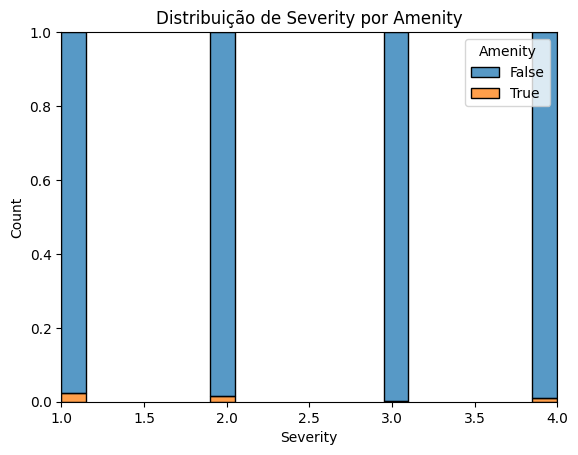

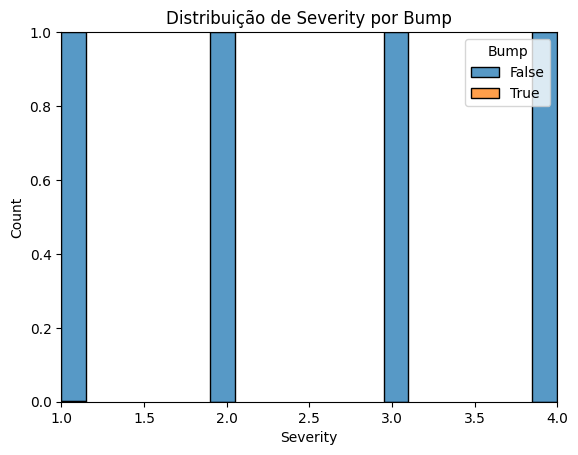

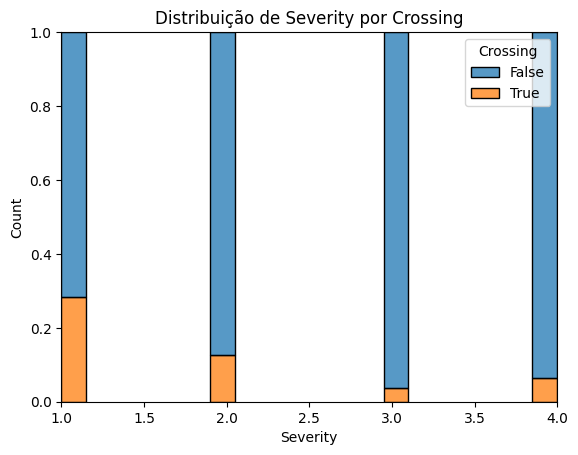

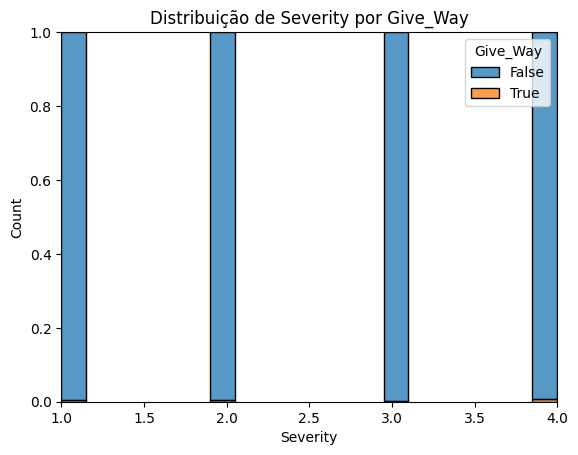

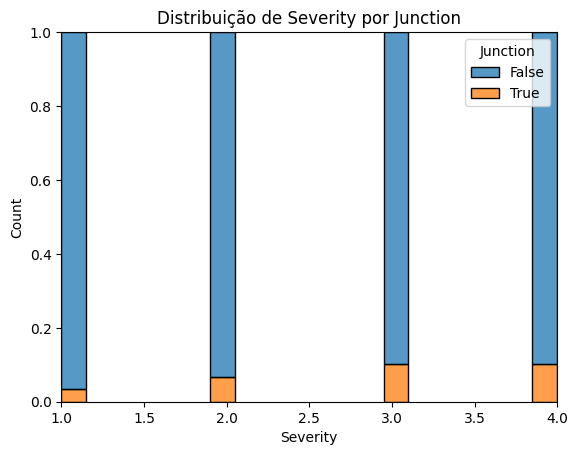

...

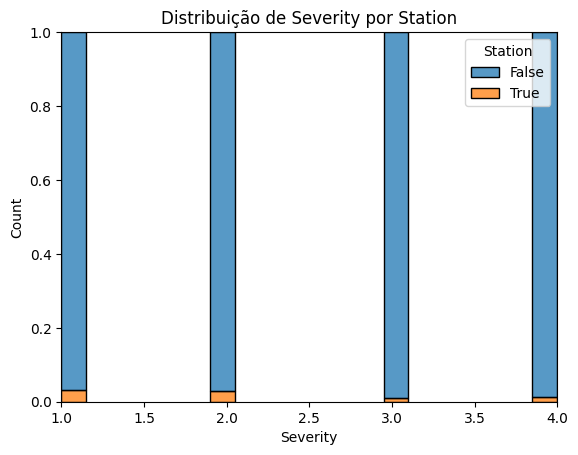

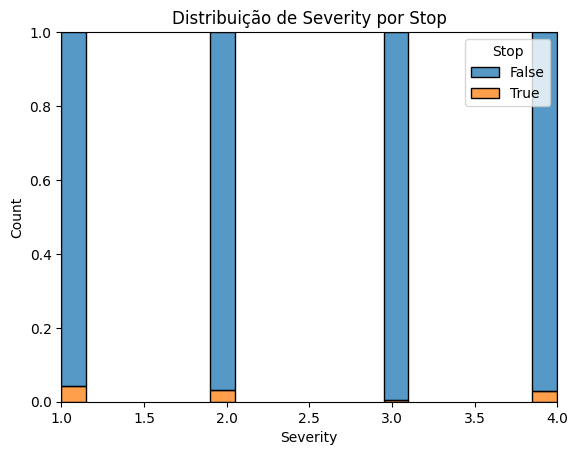

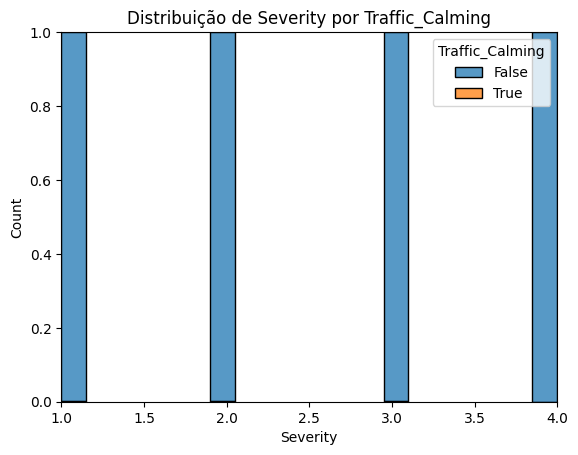

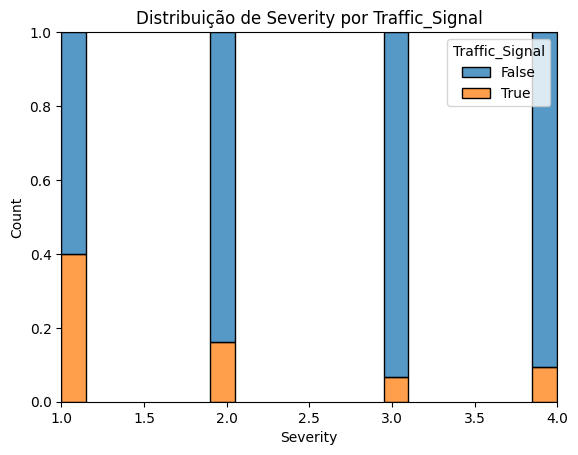

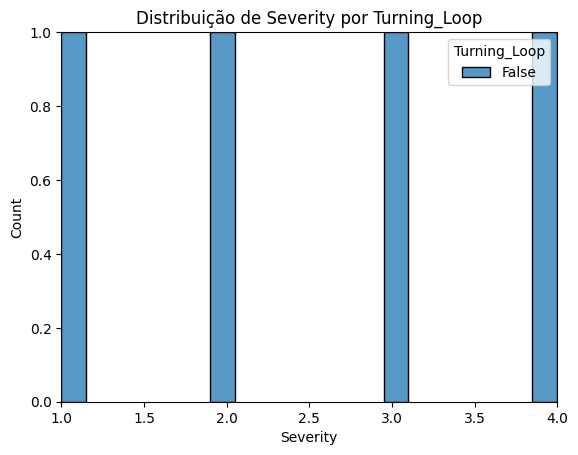

In [ ]:
for col in poi_cols:
    df_temp = X_train_pd.copy()
    df_temp['Severity'] = y_train_pd.values

    sns.histplot(data=df_temp, x='Severity', hue=col, multiple='fill')
    plt.title(f'Distribuição de Severity por {col}')
    plt.show()

#### Coclusões

Apesar da maioria das features não ter uma grande representatividade, foi possível anotar alguns padrões importantes após a análise bivariada:

- Atributos de infraestrutura reduzem a severidade:
    - Crossing: -0.169 (mais forte)
    - Amenity: -0.148
    - Traffic_Signal: -0.146
    - Stop: -0.140
    - Station: -0.139

- Interseções aumentam a severidade:
    - Junction: +0.095

- Outras features tiveram um efeito fraco/moderado ou inexistente devido à baixa ocorrência:
    - Roundabout: +0.242 (baixa ocorrência)
    - Railway: -0.066
    - Give_Way: -0.037 (baixa ocorrência)
    - Turning_Loop: -2.212 (0 ocorrência)
    - Bump: -0.107 (baixa ocorrência)
    - Traffic_Calming: -0.094 (baixa ocorrência)
    - No_Exit: -0.101 (baixa ocorrência)

- A tabela de correlação corfirma alguns padrões:
    - Presença de sinal de trânsito (Traffic_Sinal) possui ocorência de 40% com severidade 1, enquanto que para severidade 3 a ocorrência é de 6.7%.
    - Cruzamentos (Crossing) seguem esse mesmo padrão. 28% para severidade 1 e 3.6% para severidade 3.

#### Decisões

- Devido à baixa ocorrência ou por falta de correlação entre a variável alvo será removido:
    - Station
    - Amenity
    - Railway
    - Turning_Loop
    - Roundabout
    - Bump
    - Traffic_Calming
    - No_Exit
    - Give_Way
- Para os atributos restantes, uma estratégia boa pode ser uma pequena engenharia de feature:
    - ```python
        X_train_pd['infraestrutura'] = (
            X_train_pd['Traffic_Signal'] +
            X_train_pd['Crossing'] +
            X_train_pd['Stop']
        )

        X_train_pd['risco'] = X_train_pd['Junction']

<Axes: >

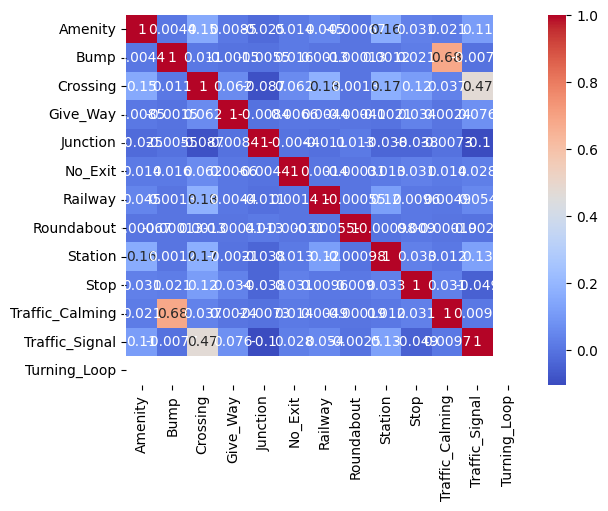

In [ ]:
sns.heatmap(X_train_pd[poi_cols].corr(), annot=True, cmap='coolwarm')

# Geo cluster

In [ ]:
from sklearn.cluster import KMeans

# criar clusters
kmeans = KMeans(n_clusters=18, random_state=42)

X_train_pd['geo_cluster'] = kmeans.fit_predict(
    X_train_pd[['Start_Lat', 'Start_Lng']]
)

In [ ]:
# cores aleatórias para clusters
cluster_colors = {
    c: "#{:06x}".format(random.randint(0, 0xFFFFFF))
    for c in X_train_pd['geo_cluster'].unique()
}

m = folium.Map(location=center, zoom_start=5)

for _, row in X_train_pd.sample(10000).iterrows():
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=3,
        color=cluster_colors[row['geo_cluster']],
        fill=True
    ).add_to(m)

m